## Project Description
Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.

Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. Here, predict two things:

Problem Statement

- Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.
- Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import zscore,boxcox
from sklearn.preprocessing import LabelEncoder, StandardScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor as VIF

from sklearn.linear_model import LinearRegression,SGDRegressor, PoissonRegressor
from sklearn.linear_model import Lasso, Ridge
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor, AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor as DTR
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error,r2_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

from sklearn.linear_model import LogisticRegression, RidgeClassifier
from imblearn.over_sampling import SMOTE
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn import metrics

import pickle 
import warnings
warnings.filterwarnings('ignore')

pd.pandas.set_option('display.max_columns',None)

In [2]:
data=pd.read_csv('https://raw.githubusercontent.com/FlipRoboTechnologies/ML_-Datasets/main/Rainfall%20Forecast/Rainfall.csv')

In [3]:
df=pd.DataFrame(data=data)

Checking the DataFrame

In [4]:
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


Checking the head of the dataset

In [5]:
df.head(10)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
5,2008-12-06,Albury,14.6,29.7,0.2,NaN,NaN,WNW,56.0,W,W,19.0,24.0,55.0,23.0,1009.2,1005.4,NaN,NaN,20.6,28.9,No,No
6,2008-12-07,Albury,14.3,25.0,0.0,NaN,NaN,W,50.0,SW,W,20.0,24.0,49.0,19.0,1009.6,1008.2,1.0,NaN,18.1,24.6,No,No
7,2008-12-08,Albury,7.7,26.7,0.0,NaN,NaN,W,35.0,SSE,W,6.0,17.0,48.0,19.0,1013.4,1010.1,NaN,NaN,16.3,25.5,No,No
8,2008-12-09,Albury,9.7,31.9,0.0,NaN,NaN,NNW,80.0,SE,NW,7.0,28.0,42.0,9.0,1008.9,1003.6,NaN,NaN,18.3,30.2,No,Yes
9,2008-12-10,Albury,13.1,30.1,1.4,NaN,NaN,W,28.0,S,SSE,15.0,11.0,58.0,27.0,1007.0,1005.7,NaN,NaN,20.1,28.2,Yes,No


Checking the tail of the dataset

In [6]:
df.tail(10)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
8415,2017-06-16,Uluru,5.2,24.3,0.0,NaN,NaN,E,24.0,SE,E,11.0,11.0,53.0,24.0,1023.8,1020.0,NaN,NaN,12.3,23.3,No,No
8416,2017-06-17,Uluru,6.4,23.4,0.0,NaN,NaN,ESE,31.0,S,ESE,15.0,17.0,53.0,25.0,1025.8,1023.0,NaN,NaN,11.2,23.1,No,No
8417,2017-06-18,Uluru,8.0,20.7,0.0,NaN,NaN,ESE,41.0,SE,E,19.0,26.0,56.0,32.0,1028.1,1024.3,NaN,7.0,11.6,20.0,No,No
8418,2017-06-19,Uluru,7.4,20.6,0.0,NaN,NaN,E,35.0,ESE,E,15.0,17.0,63.0,33.0,1027.2,1023.3,NaN,NaN,11.0,20.3,No,No
8419,2017-06-20,Uluru,3.5,21.8,0.0,NaN,NaN,E,31.0,ESE,E,15.0,13.0,59.0,27.0,1024.7,1021.2,NaN,NaN,9.4,20.9,No,No
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No
8424,2017-06-25,Uluru,14.9,NaN,0.0,NaN,NaN,NaN,NaN,ESE,ESE,17.0,17.0,62.0,36.0,1020.2,1017.9,8.0,8.0,15.0,20.9,No,NaN


Checking the shape of the dataset

In [7]:
df.shape

(8425, 23)

- The dataset has 8425 rows and 23 columns present in the dataset.

Checking the data types

In [8]:
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

- We can observe 2 types of data types present in the dataset i.e. float and object.

Checking the info of the dataset

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

- There are total 16 float columns and 7 object columns.
- Non null count is not equal in all columns. Hence null values are present in the dataset.

Checking the unique values of RainTomorrow

In [10]:
df['RainTomorrow'].unique()

array(['No', 'Yes', nan], dtype=object)

- There are 2 types of categories present the column i.e. Yes and No. Also null are present in the column.

1. We need to design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow. Hence RainTomorrow column is our target variable. 
    - We observe that RainTomorrow is categorical column with 2 categories i.e Yes and No. 
    - Hence we need to build a classification model to predict 'RainTomorrow'.
2. We need to design a predictive model with the use of machine learning algorithms to predict how much rainfall could there be. Hence Rainfall is our target variable.
    - We observe that Rainfall is continuous column with float data type.
    - Hence, we need to build a regression model to predict 'Rainfall'. 

Checking for null values

In [11]:
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

Checking the null percentage

In [12]:
df.isnull().mean()*100

Date              0.000000
Location          0.000000
MinTemp           0.890208
MaxTemp           0.712166
Rainfall          2.848665
Evaporation      41.685460
Sunshine         47.406528
WindGustDir      11.762611
WindGustSpeed    11.762611
WindDir9am        9.839763
WindDir3pm        3.655786
WindSpeed9am      0.902077
WindSpeed3pm      1.270030
Humidity9am       0.700297
Humidity3pm       1.210682
Pressure9am      15.537092
Pressure3pm      15.572700
Cloud9am         28.735905
Cloud3pm         29.139466
Temp9am           0.664688
Temp3pm           1.139466
RainToday         2.848665
RainTomorrow      2.836795
dtype: float64

- We observe all the columns except Date and Location has null value present. 
- The columns Rainfall and RainTomorrow both has null values. Since both are target columns hence we need to remove all the null columns.
- Columns like Evaporation and Sunshine has high presence of null values with approx 41% and 47% respectively.
- Columns Cloud9am and Cloud3pm has approximately 28% and 29% of null values.

Removing null columns from target Rainfall

In [13]:
df=df.dropna(subset=['Rainfall'])

Removing null columns from target RainTomorrow

In [14]:
df=df.dropna(subset=['RainTomorrow'])

- We have removed all the null value rows from Rainfall and RainTomorrow.

Removing null values from MinTemp and MaxTemp column

- We will remove null vaules from MinTemp and MaxTemp column using mode function based on locations and month. 

Creating a method to create a mode value for each group 

In [15]:
def fillna_with_mode(group):
    mode=group.mode().iloc[0] if not group.mode().empty else None
    return group.fillna(mode)

Replacing null values with mode in MinTemp based in Location and Month

In [16]:
df['Date']=pd.to_datetime(df['Date'])

Extract month from 'Date' column

In [17]:
df['Month']=df['Date'].dt.month

Group by 'Month' and 'Location' and apply the mode function in MinTemp column

In [18]:
df['MinTemp']=df.groupby(['Month','Location'])['MinTemp'].transform(fillna_with_mode)

Group by 'Month' and 'Location' and apply the mode function in MaxTemp column

In [19]:
df['MaxTemp']=df.groupby(['Month','Location'])['MaxTemp'].transform(fillna_with_mode)

Removing null values from Evaporation and Sunshine column

- We will remove null vaules from Evaporation and Sunshine column using mode function based on month.

In [20]:
df['Evaporation']=df.groupby(['Month'])['Evaporation'].transform(fillna_with_mode)

In [21]:
df['Sunshine']=df.groupby(['Month'])['Sunshine'].transform(fillna_with_mode)

Removing null values from WindGustDir and WindGustSpeed column

- We will remove null vaules from WindGustDir and WindGustSpeed column using mode function based on month.

In [22]:
df['WindGustDir']=df.groupby('Month')['WindGustDir'].transform(fillna_with_mode)

In [23]:
df['WindGustSpeed']=df.groupby('Month')['WindGustSpeed'].transform(fillna_with_mode)

Removing null values from WindDir9am and WindDir3pm column

- We will remove null vaules from WindDir9am and WindDir3pm column using mode function based on Location and month.

In [24]:
df['WindDir9am']=df.groupby(['Location','Month'])['WindDir9am'].transform(fillna_with_mode)

In [25]:
df['WindDir3pm']=df.groupby(['Location','Month'])['WindDir3pm'].transform(fillna_with_mode)

In [26]:
df['WindSpeed9am']=df.groupby(['Location','Month'])['WindSpeed9am'].transform(fillna_with_mode)

In [27]:
df['WindSpeed3pm']=df.groupby(['Location','Month'])['WindSpeed3pm'].transform(fillna_with_mode)

In [28]:
df['Humidity9am']=df.groupby(['Location','Month'])['Humidity9am'].transform(fillna_with_mode)

In [29]:
df['Humidity3pm']=df.groupby(['Location','Month'])['Humidity3pm'].transform(fillna_with_mode)

Removing null values from Pressure9am, Pressure3pm, Cloud9am, Cloud3pm column

- We will remove null vaules from Pressure9am, Pressure3pm, Cloud9am, Cloud3pm column using mode function based on month.

In [30]:
df['Pressure9am']=df.groupby('Month')['Pressure9am'].transform(fillna_with_mode)

In [31]:
df['Pressure3pm']=df.groupby('Month')['Pressure3pm'].transform(fillna_with_mode)

In [32]:
df['Cloud9am']=df.groupby('Month')['Cloud9am'].transform(fillna_with_mode)

In [33]:
df['Cloud3pm']=df.groupby('Month')['Cloud3pm'].transform(fillna_with_mode)

Removing null values from Temp9am, Temp3pm column

- We will remove null vaules from Temp9am, Temp3pm column using mode function based on month and Location.

In [34]:
df['Temp9am']=df.groupby(['Month','Location'])['Temp9am'].transform(fillna_with_mode)

In [35]:
df['Temp3pm']=df.groupby(['Month','Location'])['Temp3pm'].transform(fillna_with_mode)

Dropping Month column

In [36]:
df.drop('Month',axis=1,inplace=True)

Checking presence of Null values after removing it from the dataset

In [37]:
df.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

- We can observe that all the null values are removed.

Separating numerical and categorical columns

In [38]:
num_columns=[column for column in df.columns if df[column].dtypes!='O' and column not in 'Date']
cat_columns=[column for column in df.columns if df[column].dtypes=='O']

Checking the unique values of categorical columns

In [39]:
df['Location'].unique()

array(['Albury', 'CoffsHarbour', 'Newcastle', 'Penrith', 'Williamtown',
       'Wollongong', 'Melbourne', 'Brisbane', 'Adelaide', 'PerthAirport',
       'Darwin', 'Uluru'], dtype=object)

In [40]:
df['Location'].nunique()

12

- There are 12 unique location present in Location column.

In [41]:
df['WindGustDir'].unique()

array(['W', 'WNW', 'WSW', 'NE', 'NNW', 'N', 'NNE', 'SW', 'ENE', 'SSE',
       'S', 'NW', 'SE', 'ESE', 'E', 'SSW'], dtype=object)

In [42]:
df['WindGustDir'].nunique()

16

- There are 16 unique location present in WindGustDir column.

In [43]:
df['WindDir9am'].unique()

array(['W', 'NNW', 'SE', 'ENE', 'SW', 'SSE', 'S', 'NE', 'SSW', 'N', 'WSW',
       'ESE', 'E', 'NW', 'WNW', 'NNE'], dtype=object)

In [44]:
df['WindDir9am'].nunique()

16

- There are 16 unique location present in WindDir9am column.

In [45]:
df['WindDir3pm'].unique()

array(['WNW', 'WSW', 'E', 'NW', 'W', 'SSE', 'ESE', 'ENE', 'NNW', 'SSW',
       'SW', 'SE', 'N', 'S', 'NNE', 'NE'], dtype=object)

In [46]:
df['WindDir3pm'].nunique()

16

- There are 16 unique location present in WindDir3pm column.

In [47]:
df['RainToday'].unique()

array(['No', 'Yes'], dtype=object)

- There are 2 unique values in RainToday column

Statistical Analysis using describe method

In [48]:
df[num_columns].describe().T

,count,mean,std,min,25%,50%,75%,max
MinTemp,8079.0,13.144201,5.425047,-2.0,9.1,13.2,17.4,28.5
MaxTemp,8079.0,23.848038,6.109618,8.2,19.3,23.2,28.0,45.5
Rainfall,8079.0,2.802451,10.485324,0.0,0.0,0.0,1.0,371.0
Evaporation,8079.0,5.034819,4.185549,0.0,2.6,4.0,7.0,145.0
Sunshine,8079.0,7.987127,4.595076,0.0,4.4,9.7,11.2,13.9
WindGustSpeed,8079.0,39.183315,14.036857,7.0,30.0,37.0,48.0,107.0
WindSpeed9am,8079.0,13.686719,10.168950,0.0,6.0,13.0,20.0,61.0
WindSpeed3pm,8079.0,18.323184,9.777046,0.0,11.0,19.0,24.0,83.0
Humidity9am,8079.0,67.776829,16.863486,10.0,56.0,68.0,80.0,100.0
Humidity3pm,8079.0,51.112885,18.429496,6.0,38.0,51.0,63.0,99.0


- We can observe that high difference between 75 percentile and max in columns Rainfall, Evaporation, WindGustSpeed, WindSpeed9am and WindSpeed3pm. Hence, outliers are present in these columns.
- Mean is greater than median in columns Rainfall, Evaporation, WindGustSpeed. Hence these columns are right skewed.
- Median is greater than mean in columns Sunshine, Cloud9am. Hence, these columns are left skewed. 

In [49]:
df[cat_columns].describe().T

,count,unique,top,freq
Location,8079,12,Melbourne,1442
WindGustDir,8079,16,N,1134
WindDir9am,8079,16,N,927
WindDir3pm,8079,16,SE,926
RainToday,8079,2,No,6120
RainTomorrow,8079,2,No,6155


- Melbourne has the highest count of 1442 in Location column. There are 12 unique categories.
- In WindGustDir and WindDir9am columns, North has the highest count. There are 16 unique categories.
- In WindDir3pm columns, SE has the highest count. There are 16 unique categories.
- No count is highest in column RainToday and RainTomorrow.

### Data Visualization

Univariate analysis

Visualising categorical columns using count plot

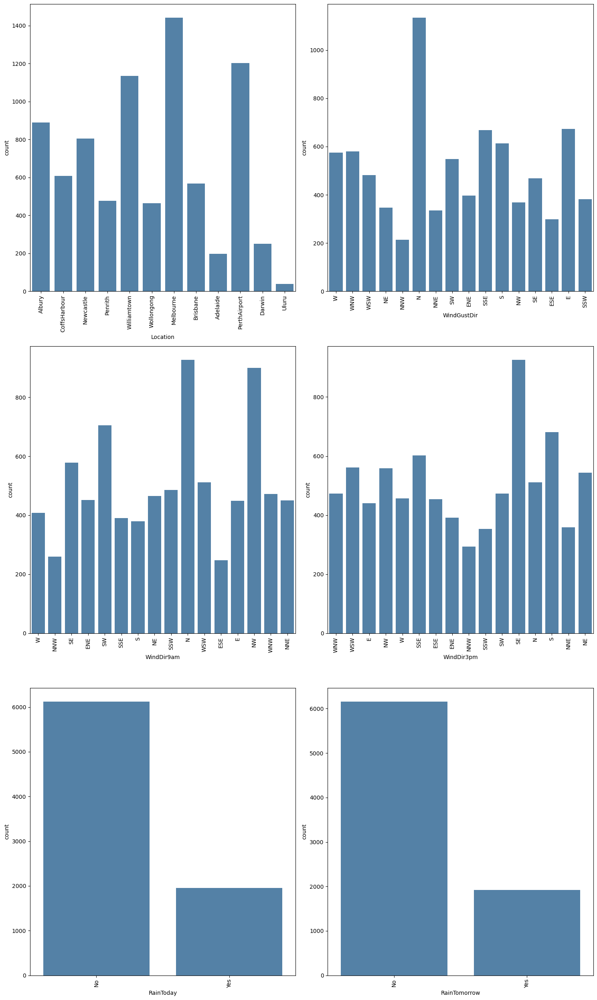

In [50]:
plt.figure(figsize=(15,25))
for index,column in enumerate(cat_columns):
    if index<=len(cat_columns):
        plt.subplot((len(cat_columns)+1)//2,2,index+1)
        sns.countplot(x=column,data=df,color='Steelblue',linewidth=.1)
        plt.xlabel(column)
        plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

- Locations Melbounrne, WilliamTown, PerthAirport has high counts. Location Uluru has the lowest count in the dataset. There are other locations which has moderate counts.
- We can observe that the direction of the strongest wind gust is highest from North. Also, wind gust from all directions are moderate. Direction of wind from NNW is the lowest
- Wind direction at 9AM from N and NW is very high. Wind direction at 9AM from all other direction is moderate.
- Wind direction at 3PM from SE very high. Wind direction at 3AM from all other direction is moderate.
- In RainToday column, No category is very high.
- In RainTomorrow column, which is our target column, the No category is very high compared to Yes category. Hence the column is very biased.

Visualising numerical columns using hist plot

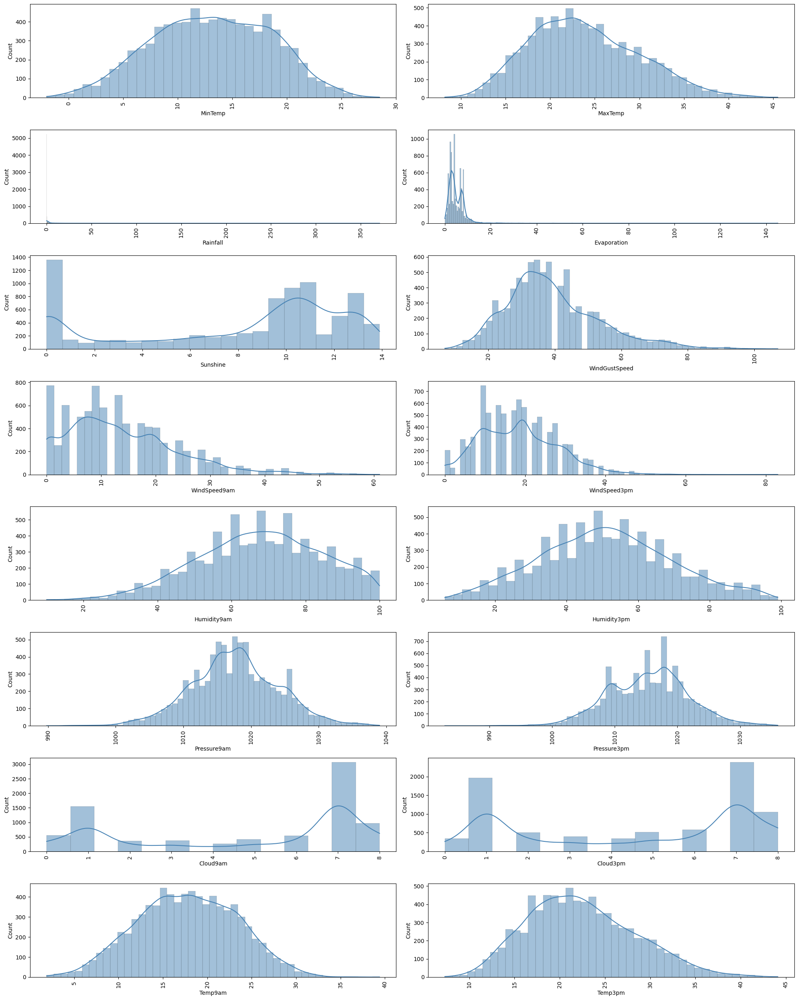

In [51]:
plt.figure(figsize=(20,25))
for index,column in enumerate(num_columns):
    if index<=len(num_columns):
        plt.subplot((len(num_columns)+1)//2,2,index+1)
        sns.histplot(x=column,kde=True,data=df,color='Steelblue',linewidth=.1)
        plt.xlabel(column)
        plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

- We can observe skewness in Rainfall column. However, since rainfall is one of the target column hence no skewness check is required.
- Column Evaporation has high right skewness. Needs to perform further analysis.
- Not much skewness is observed in any other columns.

Bivariate analysis

Visualizing categorical columns with Rainfall

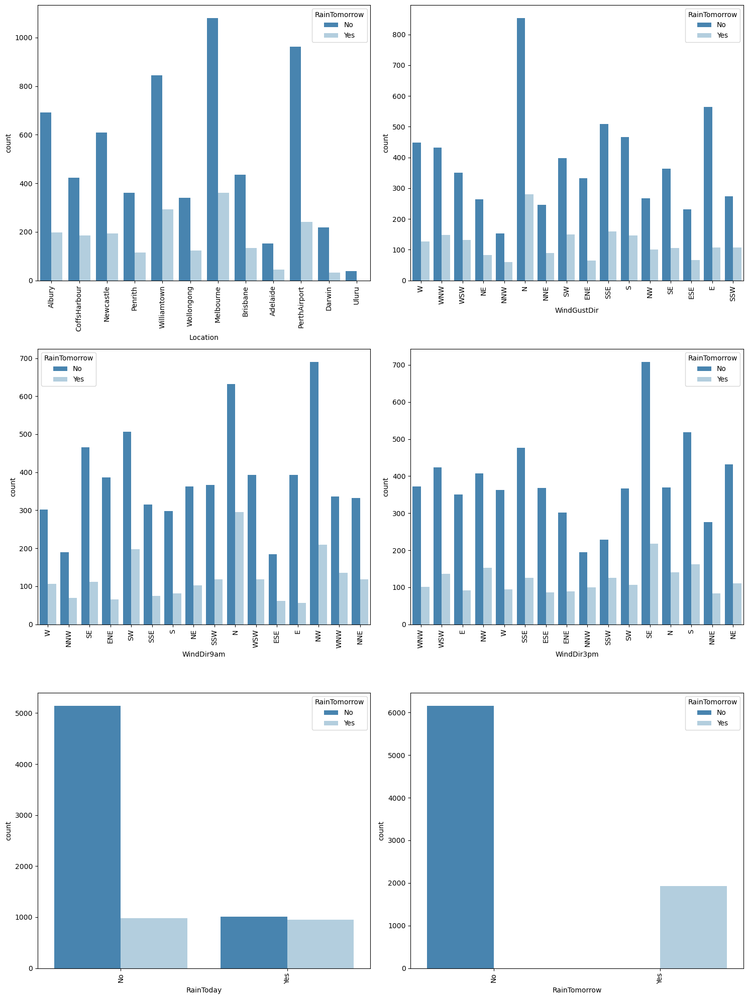

In [52]:
plt.figure(figsize=(15,20))
for index,column in enumerate(cat_columns):
    if index<=len(cat_columns):
        plt.subplot((len(cat_columns)+1)//2,2,index+1)
        sns.countplot(x=column,hue='RainTomorrow',data=df,palette='Blues_r',linewidth=.1)
        plt.xlabel(column)
        plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

- Melbourne has the highest count of rain among all categories. WilliamTown, PerthAirport also has high record of rainfall. Location Uluru has almost no record fo rainfall.
- Most of the rainfall is observed when wind gust direction is from N (North). Moderate rainfall can also be observed from all other directions.
- Rainfall is observed highest when wind direction is from N (North) in column WinDir9am. Moderate rainfall can also be observed from all other directions.
- Rainfall is observed highest when wind direction is from SE (South-East) in column WinDir3pm. Moderate rainfall can also be observed from all other directions.
- In column RainToday, we observe that there is almost equal count of Yes for both categories of RainToday.

Visualising numerical columns using hist plot with RainTomorrow

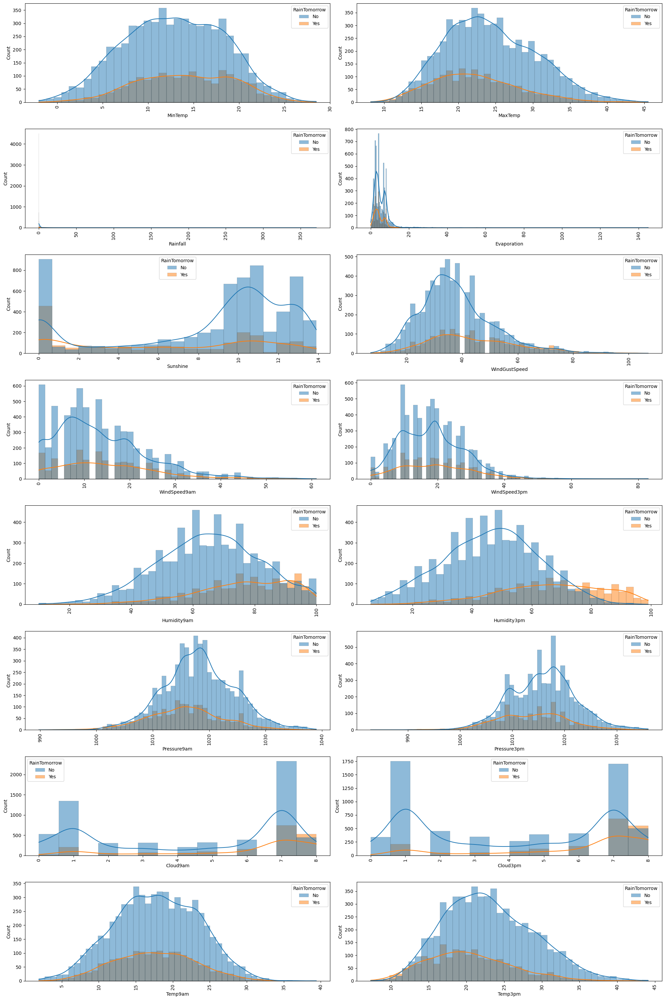

In [53]:
plt.figure(figsize=(20,30))
for index,column in enumerate(num_columns):
    if index<=len(num_columns):
        plt.subplot((len(num_columns)+1)//2,2,index+1)
        sns.histplot(x=column,hue='RainTomorrow',kde=True,data=df,color='Steelblue',linewidth=.1)
        plt.xlabel(column)
        plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

- We can observe that in all the columns No rain is greater than Yes rain. 
- In can observe that in Humidity3pm column, with more humidity rainfall is more.

Visualising numerical columns using regplot with Rainfall

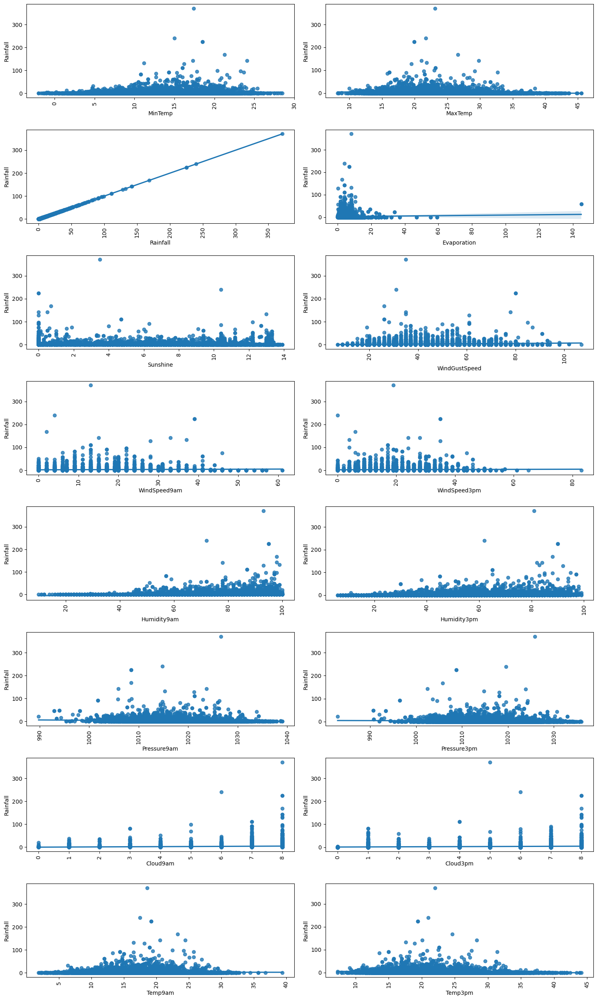

In [54]:
plt.figure(figsize=(15,25))
for index,column in enumerate(num_columns):
    if index<=len(num_columns):
        plt.subplot((len(num_columns)+1)//2,2,index+1)
        sns.regplot(x=column,y='Rainfall',data=df)
        plt.xlabel(column)
        plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

- 

Multivariate analysis

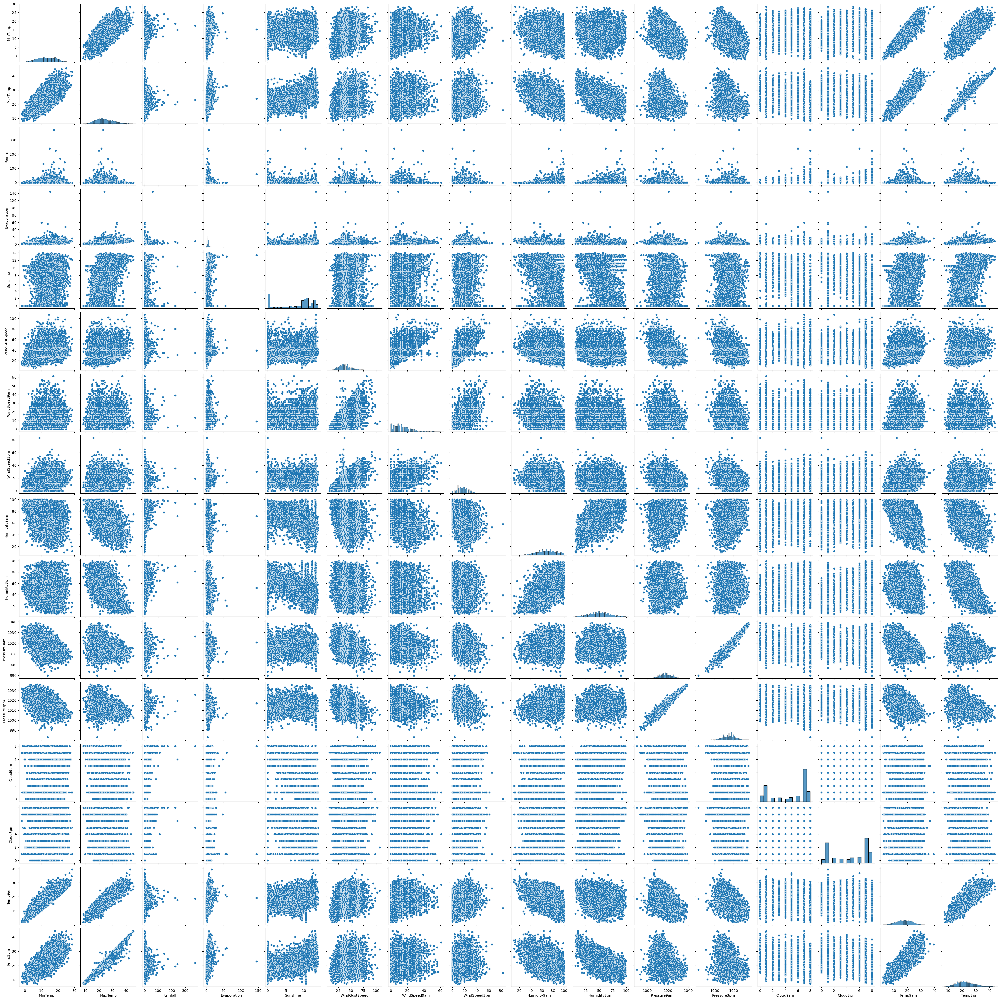

In [55]:
sns.pairplot(df)

- 

Creating 2 copies of dataframe

- One copy will predict RainTomorrow.
- Another copy will predict Rainfall.

In [56]:
df_rainfall=df.copy()
df_raintomorrow=df.copy()

#### Checking for Outliers

In [57]:
outliers_chk_list=[column for column in num_columns if column not in 'Rainfall']

Checking outliers using boxplot

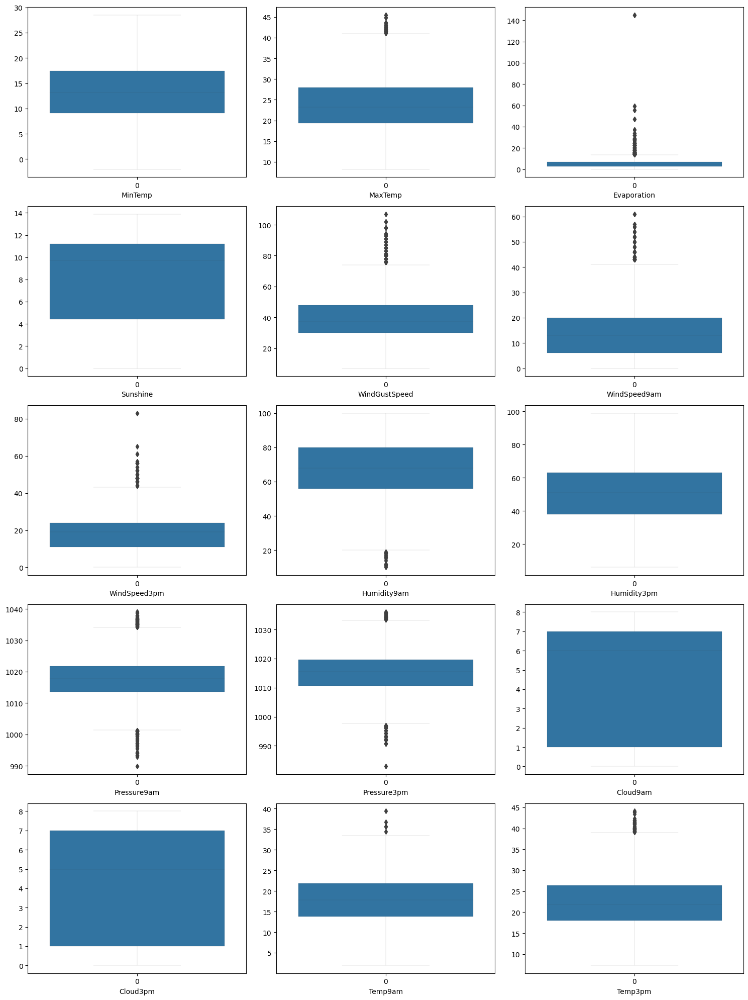

In [58]:
plt.figure(figsize=(15,20))
for index,column in enumerate(outliers_chk_list):
    if index<=len(outliers_chk_list):
        plt.subplot((len(outliers_chk_list)+2)//3,3,index+1)
        sns.boxplot(df_rainfall[column],linewidth=.1)
        plt.xlabel(column)
plt.tight_layout()
plt.show()

- Columns MaxTemp, Evaporation, WindGustSpeed, WindSpeed9am, WindSpeed9am, WindSpeed3pm, Humidity9am, Pressure9am, Pressure3pm, Temp9am, Temp3pm has outliers present.

Checking outlier using zscore

In [59]:
def outliers_check(df):
    z_score=np.abs(zscore(df_rainfall[outliers_chk_list]))
    print(np.where(z_score>3))
    return z_score

In [60]:
z_score=outliers_check(df_rainfall)

(array([  12,   12,   42,   42,   50,   50,   58,   58,   59,   59,   60,
         60,   60,   65,   65,   66,   66,  121,  265,  292,  377,  377,
        401,  401,  402,  402,  403,  403,  547,  552,  552,  665,  665,
        730,  960,  960, 1169, 1515, 1567, 1624, 1645, 1870, 1875, 1917,
       1988, 2000, 2015, 2044, 2151, 2181, 2181, 2192, 2460, 2485, 2485,
       2780, 2788, 2795, 2801, 2805, 2809, 2815, 2823, 2829, 2837, 2843,
       2851, 2857, 2865, 2871, 2879, 2885, 2893, 2899, 2907, 2913, 2917,
       2931, 2998, 2998, 2999, 3005, 3006, 3006, 3006, 3007, 3009, 3021,
       3021, 3021, 3028, 3028, 3038, 3038, 3040, 3080, 3089, 3092, 3096,
       3103, 3106, 3111, 3111, 3117, 3124, 3145, 3149, 3157, 3163, 3165,
       3169, 3180, 3187, 3187, 3200, 3200, 3211, 3211, 3212, 3355, 3355,
       3355, 3356, 3356, 3364, 3377, 3397, 3463, 3508, 3509, 3521, 3580,
       3588, 3595, 3601, 3605, 3609, 3615, 3623, 3629, 3637, 3643, 3651,
       3657, 3665, 3671, 3679, 3685, 3693, 3699, 3

Creating a copy of dataframe

In [61]:
data=df_rainfall.copy()

Removing outliers

In [62]:
def outliers_removal(z_score,data):
    data=data[(z_score<3).all(axis=1)]
    return data

In [63]:
data=outliers_removal(z_score,data)

Checking total data loss

In [64]:
total_data_loss=df_rainfall.shape[0]-data.shape[0]
total_data_loss

295

- A total of 295 rows of data is lost.

Total perent of data loss

In [65]:
total_data_loss_percentage=total_data_loss*100/df_rainfall.shape[0]
total_data_loss_percentage

3.651442010149771

- The total data lost percentage is 3.65% which is within the acceptable range.

Checking outliers using IQR

In [66]:
Q1=df_rainfall[outliers_chk_list].quantile(0.25)
Q3=df_rainfall[outliers_chk_list].quantile(0.75)

IQR=Q3-Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

bounds = (df_rainfall[outliers_chk_list]>=lower_bound) & (df_rainfall[outliers_chk_list]<=upper_bound)

df_no_outliers=df[bounds.all(axis=1)]

Checking data loss after outliers removal

In [67]:
total_data_loss_by_IQR=df_rainfall.shape[0]-df_no_outliers.shape[0]
total_data_loss_by_IQR

591

Checking data loss percentage after outliers removal using IQR

In [68]:
total_data_loss_percentage_by_IQR=(total_data_loss_by_IQR*100)/df_rainfall.shape[0]
total_data_loss_percentage_by_IQR

7.315261789825473

- Total perentage of data lost is 7.32% which is within the acceptable range.
- Hence we will use IQR to remove outliers

Removing outliers using zscore

In [69]:
df_rainfall=data.reset_index(drop=True)

Checking the shape of the dataframe after outliers removal

In [70]:
df_rainfall.shape

(7784, 23)

- Now the dataset has 7488 rows and 23 columns.

#### Checking skewness

In [71]:
df_rainfall[num_columns].skew()

MinTemp          -0.075765
MaxTemp           0.329169
Rainfall         13.542802
Evaporation       0.834529
Sunshine         -0.720571
WindGustSpeed     0.641861
WindSpeed9am      0.715909
WindSpeed3pm      0.318209
Humidity9am      -0.232522
Humidity3pm       0.137068
Pressure9am       0.095769
Pressure3pm       0.031949
Cloud9am         -0.510939
Cloud3pm         -0.259861
Temp9am          -0.038515
Temp3pm           0.346989
dtype: float64

- Low skewness is observed in Evaporation, Sunshine, WindSpeed9am. We will continue without removing skewness.
- Since the column Rainfall is our target for regression analysis, hence, we will not remove skewness.

#### Feature Selection

- We can drop the column Date as it does not have any role in predicting rainfall.

Dropping column date

In [72]:
df_rainfall.drop('Date',axis=1,inplace=True)

#### Label Encoding of categorical columns

In [73]:
cat_columns_rainfall=[column for column in df_rainfall.columns if df_rainfall[column].dtypes=='O']

In [74]:
le=LabelEncoder()
df_rainfall[cat_columns_rainfall]=df_rainfall[cat_columns_rainfall].apply(lambda x:le.fit_transform(x))

Checking the dataset

In [75]:
df_rainfall

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,1,13.4,22.9,0.6,7.4,13.3,13,44.0,13,14,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,7.0,16.9,21.8,0,0
1,1,7.4,25.1,0.0,7.4,13.3,14,44.0,6,15,4.0,22.0,44.0,25.0,1010.6,1007.8,7.0,7.0,17.2,24.3,0,0
2,1,12.9,25.7,0.0,7.4,13.3,15,46.0,13,15,19.0,26.0,38.0,30.0,1007.6,1008.7,7.0,2.0,21.0,23.2,0,0
3,1,9.2,28.0,0.0,7.4,13.3,4,24.0,9,0,11.0,9.0,45.0,16.0,1017.6,1012.8,7.0,7.0,18.1,26.5,0,0
4,1,17.5,32.3,1.0,7.4,13.3,13,41.0,1,7,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7779,9,3.5,21.8,0.0,1.6,0.0,0,31.0,2,0,15.0,13.0,59.0,27.0,1024.7,1021.2,7.0,8.0,9.4,20.9,0,0
7780,9,2.8,23.4,0.0,1.6,0.0,0,31.0,9,1,13.0,11.0,51.0,24.0,1024.6,1020.3,7.0,8.0,10.1,22.4,0,0
7781,9,3.6,25.3,0.0,1.6,0.0,6,22.0,9,3,13.0,9.0,56.0,21.0,1023.5,1019.1,7.0,8.0,10.9,24.5,0,0
7782,9,5.4,26.9,0.0,1.6,0.0,3,37.0,9,14,9.0,9.0,53.0,24.0,1021.0,1016.8,7.0,8.0,12.5,26.1,0,0


Analysing the dataset through correlation

<Axes: >

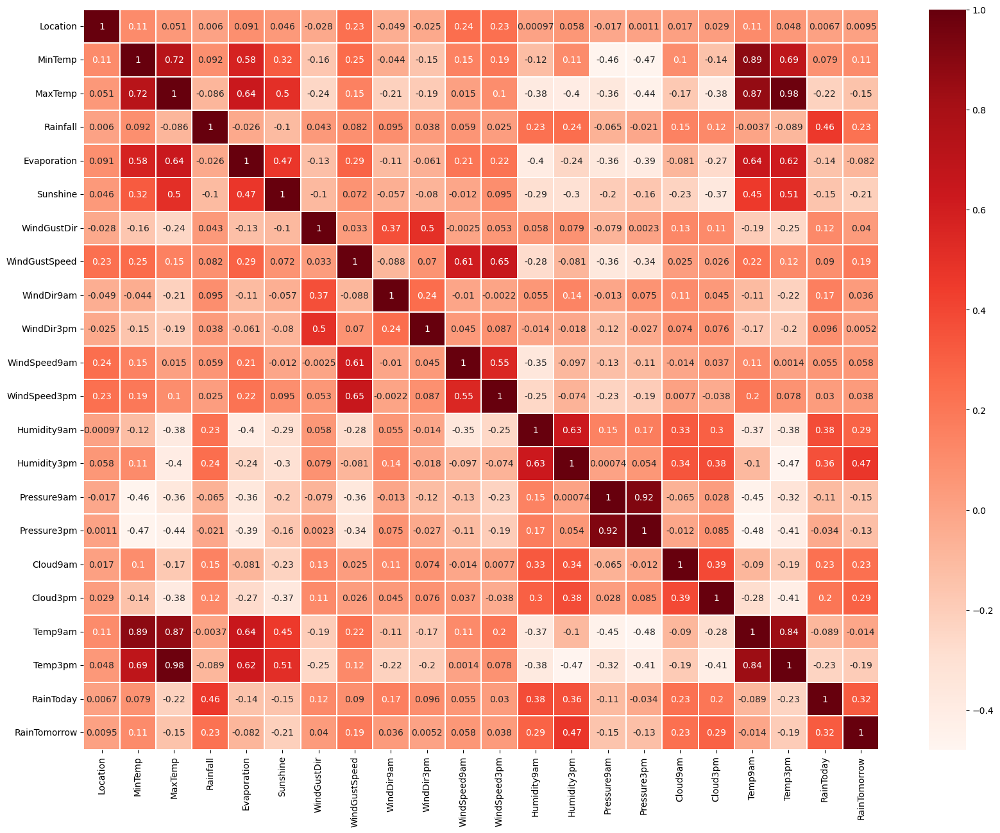

In [76]:
plt.figure(figsize=(20,15))
sns.heatmap(df_rainfall.corr(),annot=True,fmt='.2g',linewidth=.1,cmap='Reds')

- High correlation is observed amoung columns Temp9am and MinTemp, Temp9am and MaxTemp, Temp3am and MaxTemp, Pressure9am and Pressure3pm, MaxTemp and Temp3pm, MaxTemp and Temp9am, MinTemp and Temp9am, Temp9am and Temp3pm. 
- The target Rainfall has not much correlation with other columns. Low to moderate correlation can be observed with RainToday.

Scaling the dataset

- Separating the target and independent columns

In [77]:
x_rainfall=df_rainfall.drop('Rainfall',axis=1)
y_rainfall=df_rainfall['Rainfall']

In [78]:
def StandardScaling(x_rainfall):
    st=StandardScaler()
    x_rainfall=pd.DataFrame(st.fit_transform(x_rainfall),columns=x_rainfall.columns)
    return x_rainfall

In [79]:
StandardScaling(x_rainfall)

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,-1.496148,0.060301,-0.140064,0.969481,1.158503,1.149907,0.424234,1.197312,1.403021,0.717742,0.657401,0.170964,-1.608240,-1.622629,-1.371849,1.123982,0.876166,-0.136627,-0.090494,-0.567658,-0.555387
1,-1.496148,-1.046687,0.227753,0.969481,1.158503,1.359760,0.424234,-0.355335,1.628576,-0.966805,0.442537,-1.451141,-1.444105,-1.157113,-1.258223,0.771168,0.876166,-0.082817,0.338529,-0.567658,-0.555387
2,-1.496148,-0.031948,0.328067,0.969481,1.158503,1.569613,0.576833,1.197312,1.628576,0.612458,0.872266,-1.811609,-1.170546,-1.638681,-1.112132,0.771168,-0.897493,0.598780,0.149759,-0.567658,-0.555387
3,-1.496148,-0.714590,0.712604,0.969481,1.158503,-0.738773,-1.101755,0.310085,-1.754740,-0.229816,-0.954082,-1.391063,-1.936511,-0.033453,-0.446607,0.771168,0.876166,0.078614,0.716070,-0.567658,-0.555387
4,-1.496148,0.816742,1.431520,0.969481,1.158503,1.149907,0.195336,-1.464369,-0.175859,-0.650952,0.227672,0.831822,-1.006411,-1.125008,-1.550404,0.771168,1.230897,0.024804,1.265220,-0.567658,-0.555387
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7779,1.033326,-1.766229,-0.323973,-1.158561,-1.741829,-1.578187,-0.567659,-1.242563,-1.754740,0.191321,-0.524353,-0.549971,-1.334682,1.106259,0.916906,0.771168,1.230897,-1.481885,-0.244942,-0.567658,-0.555387
7780,1.033326,-1.895377,-0.056470,-1.158561,-1.741829,-1.578187,-0.567659,0.310085,-1.529186,-0.019247,-0.739217,-1.030595,-1.498817,1.090206,0.770816,0.771168,1.230897,-1.356327,0.012472,-0.567658,-0.555387
7781,1.033326,-1.747779,0.261191,-1.158561,-1.741829,-0.319067,-1.254354,0.310085,-1.078077,-0.019247,-0.954082,-0.730205,-1.662952,0.913631,0.576028,0.771168,1.230897,-1.212833,0.372851,-0.567658,-0.555387
7782,1.033326,-1.415682,0.528695,-1.158561,-1.741829,-0.948627,-0.109862,0.310085,1.403021,-0.440384,-0.954082,-0.910439,-1.498817,0.512324,0.202685,0.771168,1.230897,-0.925845,0.647426,-0.567658,-0.555387


#### Checking the Variance Inflation Factor

In [80]:
def vif_cal(x_rainfall):
    vif=pd.DataFrame()
    vif['Columns']=x_rainfall.columns
    vif['VIF Factor']=[VIF(x_rainfall.values,i) for i in range(x_rainfall.shape[1])]
    return vif

In [81]:
vif_cal(x_rainfall)

,Columns,VIF Factor
0,Location,4.852951
1,MinTemp,57.247743
2,MaxTemp,480.667161
3,Evaporation,8.552385
4,Sunshine,6.694757
5,WindGustDir,5.258549
6,WindGustSpeed,23.202684
7,WindDir9am,4.949422
8,WindDir3pm,5.794424
9,WindSpeed9am,6.102662


- High variance inflation is present in columns Pressure9am, Pressure3pm, Temp3pm, MaxTemp, Temp9am, MinTemp, Humidity9am, Humidity3pm, WindGustSpeed.
- We will drop column Pressure9am.

Dropping column Pressure9am

In [82]:
x_rainfall.drop('Pressure9am',axis=1,inplace=True)

Checking VIF

In [83]:
vif_cal(x_rainfall)

,Columns,VIF Factor
0,Location,4.844523
1,MinTemp,56.814161
2,MaxTemp,480.572499
3,Evaporation,8.538666
4,Sunshine,6.297284
5,WindGustDir,5.251992
6,WindGustSpeed,23.198625
7,WindDir9am,4.917168
8,WindDir3pm,5.691929
9,WindSpeed9am,6.102636


- High variance inflation is present in columns Temp3pm, MaxTemp, Temp9am, Pressure3pm, Humidity9am, Humidity3pm, MinTemp, WindGustSpeed and Evaporation.
- We will drop column Temp3pm.

Dropping column Temp3pm

In [84]:
x_rainfall.drop('Temp3pm',axis=1,inplace=True)

Checking VIF

In [85]:
vif_cal(x_rainfall)

,Columns,VIF Factor
0,Location,4.838720
1,MinTemp,56.525319
2,MaxTemp,154.641120
3,Evaporation,8.538526
4,Sunshine,6.291306
5,WindGustDir,5.249245
6,WindGustSpeed,22.990326
7,WindDir9am,4.895509
8,WindDir3pm,5.660433
9,WindSpeed9am,6.092006


- High variance inflation is present in columns Temp9am, MaxTemp, Pressure3pm, Humidity9am, Humidity3pm, MinTemp, WindGustSpeed and Evaporation.
- We will drop column Temp9am.

Dropping column Temp9am

In [86]:
x_rainfall.drop('Temp9am',axis=1,inplace=True)

Checking VIF

In [87]:
vif_cal(x_rainfall)

,Columns,VIF Factor
0,Location,4.795853
1,MinTemp,30.166985
2,MaxTemp,89.165903
3,Evaporation,8.535688
4,Sunshine,6.225986
5,WindGustDir,5.244446
6,WindGustSpeed,22.703850
7,WindDir9am,4.895391
8,WindDir3pm,5.660233
9,WindSpeed9am,5.991283


- High variance inflation is present in columns Pressure3pm, Humidity9am, Humidity3pm, MaxTemp, MinTemp, WindGustSpeed and Evaporation.
- We will drop column Pressure3pm.

Dropping column Pressure3pm

In [88]:
x_rainfall.drop('Pressure3pm',axis=1,inplace=True)

Checking VIF

In [89]:
vif_cal(x_rainfall)

,Columns,VIF Factor
0,Location,4.795503
1,MinTemp,22.681353
2,MaxTemp,43.395973
3,Evaporation,8.531723
4,Sunshine,6.179693
5,WindGustDir,5.227400
6,WindGustSpeed,21.697825
7,WindDir9am,4.544890
8,WindDir3pm,5.550312
9,WindSpeed9am,5.574759


- High variance inflation is present in columns MinTemp, MaxTemp, WindGustSpeed, Humidity9am, Humidity3pm.
- Although VIF is high in these columns, we will continue with modelling as these columns are essential in prediction.

### Modelling

Calculating best random state and score

In [90]:
def random_state_cal(x,y):
    best_randomstate = None
    best_score = 0
    
    for rs in range(1,201):
        x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.3,random_state=rs)
        lr=LinearRegression()
        lr.fit(x_train,y_train)
        pred=lr.predict(x_test)
        score=r2_score(y_test,pred)
        
        if score>best_score:
            best_score=score
            best_randomstate=rs
    print('R2 Score :{} Random state :{}'.format(best_score,best_randomstate))

In [91]:
random_state_cal(x_rainfall,y_rainfall)

R2 Score :0.34829415464217195 Random state :151


Applying train_test_split with test_size=.30 and random_state=151

In [92]:
x_train,x_test,y_train,y_test=train_test_split(x_rainfall,y_rainfall,test_size=.3,random_state=151)

Linear Regression Model

In [93]:
def linear_regression(x_train,x_test,y_train,y_test):
    
    model_lr=LinearRegression()
    model_lr.fit(x_train,y_train)
    prediction_lr=model_lr.predict(x_test)
    prediction_y_train=model_lr.predict(x_train)
    
    r2=r2_score(y_test,prediction_lr) * 100
    r2_train=r2_score(y_train,prediction_y_train) * 100
    mae=mean_absolute_error(y_test,prediction_lr)
    mse=mean_squared_error(y_test,prediction_lr)
    rmse=np.sqrt(mean_squared_error(y_test,prediction_lr))
    prediction_chart=pd.DataFrame({'Linear Regression':['R2 Score',
                                             'R2 Score on Training Data',
                                             'Mean Absolute Error',
                                             'Mean Squared Error', 
                                             'Root Mean Squared Error'], 
                                   'Scores':[r2,r2_train,mae,mse,rmse]
                                  })
    return prediction_chart,prediction_lr 

In [94]:
prediction_chart,prediction_lr=linear_regression(x_train,x_test,y_train,y_test)
prediction_chart

,Linear Regression,Scores
0,R2 Score,34.829415
1,R2 Score on Training Data,20.286998
2,Mean Absolute Error,2.878344
3,Mean Squared Error,41.469970
4,Root Mean Squared Error,6.439718


Lasso Regression

In [95]:
def lasso(x_train,x_test,y_train,y_test):
    
    model_lasso=Lasso()
    model_lasso.fit(x_train,y_train)
    prediction_las=model_lasso.predict(x_test)
    prediction_y_train=model_lasso.predict(x_train)
    
    r2=r2_score(y_test,prediction_las) * 100
    r2_train=r2_score(y_train,prediction_y_train) * 100
    mae=mean_absolute_error(y_test,prediction_las)
    mse=mean_squared_error(y_test,prediction_las)
    rmse=np.sqrt(mean_squared_error(y_test,prediction_las))
    prediction_chart=pd.DataFrame({'Lasso':['R2 Score',
                                             'R2 Score on Training Data',
                                             'Mean Absolute Error',
                                             'Mean Squared Error', 
                                             'Root Mean Squared Error'], 
                                   'Scores':[r2,r2_train,mae,mse,rmse]
                                  })
    return prediction_chart,prediction_las

In [96]:
prediction_chart,prediction_las=lasso(x_train,x_test,y_train,y_test)
prediction_chart

,Lasso,Scores
0,R2 Score,23.650710
1,R2 Score on Training Data,14.658499
2,Mean Absolute Error,3.381000
3,Mean Squared Error,48.583311
4,Root Mean Squared Error,6.970173


Ridge Regression

In [97]:
def ridge(x_train,x_test,y_train,y_test):
    
    model_ridge=Ridge()
    model_ridge.fit(x_train,y_train)
    prediction_ridge=model_ridge.predict(x_test)
    prediction_y_train=model_ridge.predict(x_train)
    
    r2=r2_score(y_test,prediction_ridge) * 100
    r2_train=r2_score(y_train,prediction_y_train) * 100
    mae=mean_absolute_error(y_test,prediction_ridge)
    mse=mean_squared_error(y_test,prediction_ridge)
    rmse=np.sqrt(mean_squared_error(y_test,prediction_ridge))
    prediction_chart=pd.DataFrame({'Ridge':['R2 Score',
                                             'R2 Score on Training Data',
                                             'Mean Absolute Error',
                                             'Mean Squared Error', 
                                             'Root Mean Squared Error'], 
                                   'Scores':[r2,r2_train,mae,mse,rmse]
                                  })
    return prediction_chart,prediction_ridge

In [98]:
prediction_chart,prediction_ridge=ridge(x_train,x_test,y_train,y_test)
prediction_chart

,Ridge,Scores
0,R2 Score,34.828417
1,R2 Score on Training Data,20.286980
2,Mean Absolute Error,2.878406
3,Mean Squared Error,41.470606
4,Root Mean Squared Error,6.439768


Random Forest

In [99]:
def random_forest(x_train,x_test,y_train,y_test):
    
    model_ran_forest=RandomForestRegressor()
    model_ran_forest.fit(x_train,y_train)
    prediction_rf=model_ran_forest.predict(x_test)
    prediction_y_train=model_ran_forest.predict(x_train)
    
    r2=r2_score(y_test,prediction_rf) * 100
    r2_train=r2_score(y_train,prediction_y_train) * 100
    mae=mean_absolute_error(y_test,prediction_rf)
    mse=mean_squared_error(y_test,prediction_rf)
    rmse=np.sqrt(mean_squared_error(y_test,prediction_rf))
    prediction_chart=pd.DataFrame({'Random Forest':['R2 Score',
                                             'R2 Score on Training Data',
                                             'Mean Absolute Error',
                                             'Mean Squared Error', 
                                             'Root Mean Squared Error'], 
                                   'Scores':[r2,r2_train,mae,mse,rmse]
                                  })
    return prediction_chart, prediction_rf

In [100]:
prediction_chart, prediction_rf=random_forest(x_train,x_test,y_train,y_test)
prediction_chart

,Random Forest,Scores
0,R2 Score,32.136520
1,R2 Score on Training Data,90.782937
2,Mean Absolute Error,1.830664
3,Mean Squared Error,43.183539
4,Root Mean Squared Error,6.571418


KNN Regression

In [101]:
def knn(x_train,x_test,y_train,y_test):
    
    model_knn=KNN()
    model_knn.fit(x_train,y_train)
    prediction_knn=model_knn.predict(x_test)
    prediction_y_train=model_knn.predict(x_train)
    
    r2=r2_score(y_test,prediction_knn) * 100
    r2_train=r2_score(y_train,prediction_y_train) * 100
    mae=mean_absolute_error(y_test,prediction_knn)
    mse=mean_squared_error(y_test,prediction_knn)
    rmse=np.sqrt(mean_squared_error(y_test,prediction_knn))
    prediction_chart=pd.DataFrame({'KNN':['R2 Score',
                                             'R2 Score on Training Data',
                                             'Mean Absolute Error',
                                             'Mean Squared Error', 
                                             'Root Mean Squared Error'], 
                                   'Scores':[r2,r2_train,mae,mse,rmse]
                                  })
    return prediction_chart,prediction_knn

In [102]:
prediction_chart,prediction_knn=knn(x_train,x_test,y_train,y_test)
prediction_chart

,KNN,Scores
0,R2 Score,-5.984630
1,R2 Score on Training Data,39.551539
2,Mean Absolute Error,3.232397
3,Mean Squared Error,67.441154
4,Root Mean Squared Error,8.212256


SVR Regression

In [103]:
def svr(x_train,x_test,y_train,y_test):
    
    model_svr=SVR()
    model_svr.fit(x_train,y_train)
    prediction_svr=model_svr.predict(x_test)
    prediction_y_train=model_svr.predict(x_train)
    
    r2=r2_score(y_test,prediction_svr) * 100
    r2_train=r2_score(y_train,prediction_y_train) * 100
    mae=mean_absolute_error(y_test,prediction_svr)
    mse=mean_squared_error(y_test,prediction_svr)
    rmse=np.sqrt(mean_squared_error(y_test,prediction_svr))
    prediction_chart=pd.DataFrame({'SVR':['R2 Score',
                                             'R2 Score on Training Data',
                                             'Mean Absolute Error',
                                             'Mean Squared Error', 
                                             'Root Mean Squared Error'], 
                                   'Scores':[r2,r2_train,mae,mse,rmse]
                                  })
    return prediction_chart, prediction_svr

In [104]:
prediction_chart, prediction_svr=svr(x_train,x_test,y_train,y_test)
prediction_chart

,SVR,Scores
0,R2 Score,4.069440
1,R2 Score on Training Data,2.766063
2,Mean Absolute Error,2.426479
3,Mean Squared Error,61.043452
4,Root Mean Squared Error,7.813031


Decision Tree Regressor

In [105]:
def decision_tree(x_train,x_test,y_train,y_test):
    
    model_dt=DTR()
    model_dt.fit(x_train,y_train)
    prediction_dt=model_dt.predict(x_test)
    prediction_y_train=model_dt.predict(x_train)
    
    r2=r2_score(y_test,prediction_dt) * 100
    r2_train=r2_score(y_train,prediction_y_train) * 100
    mae=mean_absolute_error(y_test,prediction_dt)
    mse=mean_squared_error(y_test,prediction_dt)
    rmse=np.sqrt(mean_squared_error(y_test,prediction_dt))
    prediction_chart=pd.DataFrame({'Decision Tree':['R2 Score',
                                             'R2 Score on Training Data',
                                             'Mean Absolute Error',
                                             'Mean Squared Error', 
                                             'Root Mean Squared Error'], 
                                   'Scores':[r2,r2_train,mae,mse,rmse]
                                  })
    return prediction_chart, prediction_dt

In [106]:
prediction_chart, prediction_dt=decision_tree(x_train,x_test,y_train,y_test)
prediction_chart

,Decision Tree,Scores
0,R2 Score,-64.311125
1,R2 Score on Training Data,100.000000
2,Mean Absolute Error,2.124743
3,Mean Squared Error,104.556027
4,Root Mean Squared Error,10.225264


Gradient Boosting Regressor

In [107]:
def gradient_boosting(x_train,x_test,y_train,y_test):
    
    model_gbr=GradientBoostingRegressor()
    model_gbr.fit(x_train,y_train)
    prediction_gb=model_gbr.predict(x_test)
    prediction_y_train=model_gbr.predict(x_train)
    
    r2=r2_score(y_test,prediction_gb) * 100
    r2_train=r2_score(y_train,prediction_y_train) * 100
    mae=mean_absolute_error(y_test,prediction_gb)
    mse=mean_squared_error(y_test,prediction_gb)
    rmse=np.sqrt(mean_squared_error(y_test,prediction_gb))
    prediction_chart=pd.DataFrame({'Gradient Boosting Regressor':['R2 Score',
                                             'R2 Score on Training Data',
                                             'Mean Absolute Error',
                                             'Mean Squared Error', 
                                             'Root Mean Squared Error'], 
                                   'Scores':[r2,r2_train,mae,mse,rmse]
                                  })
    return prediction_chart, prediction_gb

In [108]:
prediction_chart, prediction_gb=gradient_boosting(x_train,x_test,y_train,y_test)
prediction_chart

,Gradient Boosting Regressor,Scores
0,R2 Score,29.186202
1,R2 Score on Training Data,67.513837
2,Mean Absolute Error,2.253978
3,Mean Squared Error,45.060914
4,Root Mean Squared Error,6.712743


ExtraTrees Regression

In [109]:
def extra_trees_regressor(x_train,x_test,y_train,y_test):
    
    model_etr=ExtraTreesRegressor()
    model_etr.fit(x_train,y_train)
    prediction_etr=model_etr.predict(x_test)
    prediction_y_train=model_etr.predict(x_train)
    
    r2=r2_score(y_test,prediction_etr) * 100
    r2_train=r2_score(y_train,prediction_y_train) * 100
    mae=mean_absolute_error(y_test,prediction_etr)
    mse=mean_squared_error(y_test,prediction_etr)
    rmse=np.sqrt(mean_squared_error(y_test,prediction_etr))
    prediction_chart=pd.DataFrame({'Extra Trees Regressor':['R2 Score',
                                             'R2 Score on Training Data',
                                             'Mean Absolute Error',
                                             'Mean Squared Error', 
                                             'Root Mean Squared Error'], 
                                   'Scores':[r2,r2_train,mae,mse,rmse]
                                  })
    return prediction_chart, prediction_etr

In [110]:
prediction_chart, prediction_etr=extra_trees_regressor(x_train,x_test,y_train,y_test)
prediction_chart

,Extra Trees Regressor,Scores
0,R2 Score,49.183987
1,R2 Score on Training Data,100.000000
2,Mean Absolute Error,1.501315
3,Mean Squared Error,32.335732
4,Root Mean Squared Error,5.686452


AdaBoost Regressor

In [111]:
def adaboost_regressor(x_train,x_test,y_train,y_test):
    
    model_abr=AdaBoostRegressor()
    model_abr.fit(x_train,y_train)
    prediction_abr=model_abr.predict(x_test)
    prediction_y_train=model_abr.predict(x_train)
    
    r2=r2_score(y_test,prediction_abr) * 100
    r2_train=r2_score(y_train,prediction_y_train) * 100
    mae=mean_absolute_error(y_test,prediction_abr)
    mse=mean_squared_error(y_test,prediction_abr)
    rmse=np.sqrt(mean_squared_error(y_test,prediction_abr))
    prediction_chart=pd.DataFrame({'AdaBoostRegressor':['R2 Score',
                                             'R2 Score on Training Data',
                                             'Mean Absolute Error',
                                             'Mean Squared Error', 
                                             'Root Mean Squared Error'], 
                                   'Scores':[r2,r2_train,mae,mse,rmse]
                                  })
    return prediction_chart, prediction_abr

In [112]:
prediction_chart, prediction_abr=adaboost_regressor(x_train,x_test,y_train,y_test)
prediction_chart

,AdaBoostRegressor,Scores
0,R2 Score,-126.417351
1,R2 Score on Training Data,-11.193961
2,Mean Absolute Error,10.381779
3,Mean Squared Error,144.076055
4,Root Mean Squared Error,12.003169


SGD Regressor

In [113]:
def sgd_regressor(x_train,x_test,y_train,y_test):
    
    model_sgd=SGDRegressor()
    model_sgd.fit(x_train,y_train)
    prediction_sgd=model_sgd.predict(x_test)
    prediction_y_train=model_sgd.predict(x_train)
    
    r2=r2_score(y_test,prediction_sgd) * 100
    r2_train=r2_score(y_train,prediction_y_train) * 100
    mae=mean_absolute_error(y_test,prediction_sgd)
    mse=mean_squared_error(y_test,prediction_sgd)
    rmse=np.sqrt(mean_squared_error(y_test,prediction_sgd))
    prediction_chart=pd.DataFrame({'SGDRegressor':['R2 Score',
                                             'R2 Score on Training Data',
                                             'Mean Absolute Error',
                                             'Mean Squared Error', 
                                             'Root Mean Squared Error'], 
                                   'Scores':[r2,r2_train,mae,mse,rmse]
                                  })
    return prediction_chart, prediction_sgd

In [114]:
prediction_chart, prediction_sgd=sgd_regressor(x_train,x_test,y_train,y_test)
prediction_chart

,SGDRegressor,Scores
0,R2 Score,-1.879778e+23
1,R2 Score on Training Data,-9.635286e+22
2,Mean Absolute Error,2.783809e+11
3,Mean Squared Error,1.196158e+23
4,Root Mean Squared Error,3.458552e+11


Poisson Regressor

In [115]:
def poisson_regressor(x_train,x_test,y_train,y_test):
    
    model_pr=PoissonRegressor()
    model_pr.fit(x_train,y_train)
    prediction_pr=model_pr.predict(x_test)
    prediction_y_train=model_pr.predict(x_train)
    
    r2=r2_score(y_test,prediction_pr) * 100
    r2_train=r2_score(y_train,prediction_y_train) * 100
    mae=mean_absolute_error(y_test,prediction_pr)
    mse=mean_squared_error(y_test,prediction_pr)
    rmse=np.sqrt(mean_squared_error(y_test,prediction_pr))
    prediction_chart=pd.DataFrame({'PoissonRegressor':['R2 Score',
                                             'R2 Score on Training Data',
                                             'Mean Absolute Error',
                                             'Mean Squared Error', 
                                             'Root Mean Squared Error'], 
                                   'Scores':[r2,r2_train,mae,mse,rmse]
                                  })
    return prediction_chart, prediction_pr

In [116]:
prediction_chart, prediction_pr=poisson_regressor(x_train,x_test,y_train,y_test)
prediction_chart

,PoissonRegressor,Scores
0,R2 Score,25.918947
1,R2 Score on Training Data,20.595619
2,Mean Absolute Error,2.807489
3,Mean Squared Error,47.139964
4,Root Mean Squared Error,6.865855


#### Cross validating the models

In [117]:
def cross_validation(x,y,*args):
    
    # Cross validation for LinearRegression
    cv_score_lr= cross_val_score(LinearRegression(),x,y,cv=5, scoring='r2')
    cv_r2_score_lr=cv_score_lr.mean()
    r2_lr=r2_score(y_test,prediction_lr)
    score_diff_lr=(r2_lr-cv_r2_score_lr)
    
    # Cross validation for Lasso
    cv_score_las= cross_val_score(Lasso(),x,y,cv=5, scoring='r2')
    cv_r2_score_las=cv_score_las.mean()
    r2_las=r2_score(y_test,prediction_las)
    score_diff_las=(r2_las-cv_r2_score_las)
    
    # Cross validation for Ridge
    cv_score_ridge= cross_val_score(Ridge(),x,y,cv=5, scoring='r2')
    cv_r2_score_ridge=cv_score_ridge.mean()
    r2_ridge=r2_score(y_test,prediction_ridge)
    score_diff_ridge=(r2_ridge-cv_r2_score_ridge)
    
    # Cross validation for Random Forest
    cv_score_rf= cross_val_score(RandomForestRegressor(),x,y,cv=5, scoring='r2')
    cv_r2_score_rf=cv_score_rf.mean()
    r2_rf=r2_score(y_test,prediction_rf)
    score_diff_rf=(r2_rf-cv_r2_score_rf)
    
    # Cross validation for KNN
    cv_score_knn= cross_val_score(KNN(),x,y,cv=5, scoring='r2')
    cv_r2_score_knn=cv_score_knn.mean()
    r2_knn=r2_score(y_test,prediction_knn)
    score_diff_knn=(r2_knn-cv_r2_score_knn)
    
    # Cross validation for SVR
    cv_score_svr= cross_val_score(SVR(),x,y,cv=5, scoring='r2')
    cv_r2_score_svr=cv_score_svr.mean()
    r2_svr=r2_score(y_test,prediction_svr)
    score_diff_svr=(r2_svr-cv_r2_score_svr)
    
    # Cross validation for Decision Tree
    cv_score_dt= cross_val_score(DTR(),x,y,cv=5, scoring='r2')
    cv_r2_score_dt=cv_score_dt.mean()
    r2_dt=r2_score(y_test,prediction_dt)
    score_diff_dt=(r2_dt-cv_r2_score_dt)
    
    # Cross validation for GradientBoost
    cv_score_gb= cross_val_score(GradientBoostingRegressor(),x,y,cv=5, scoring='r2')
    cv_r2_score_gb=cv_score_gb.mean()
    r2_gb=r2_score(y_test,prediction_gb)
    score_diff_gb=(r2_gb-cv_r2_score_gb)
    
    # Cross validation for ExtraTreesRegressor
    cv_score_etr= cross_val_score(ExtraTreesRegressor(),x,y,cv=5, scoring='r2')
    cv_r2_score_etr=cv_score_etr.mean()
    r2_etr=r2_score(y_test,prediction_etr)
    score_diff_etr=(r2_etr-cv_r2_score_etr)
    
    # Cross validation for AdaBoostRegressor
    cv_score_abr= cross_val_score(AdaBoostRegressor(),x,y,cv=5, scoring='r2')
    cv_r2_score_abr=cv_score_abr.mean()
    r2_abr=r2_score(y_test,prediction_abr)
    score_diff_abr=(r2_abr-cv_r2_score_abr)
    
    # Cross validation for SGDRegressor
    cv_score_sgd= cross_val_score(SGDRegressor(),x,y,cv=5, scoring='r2')
    cv_r2_score_sgd=cv_score_sgd.mean()
    r2_sgd=r2_score(y_test,prediction_sgd)
    score_diff_sgd=(r2_sgd-cv_r2_score_sgd)
    
    # Cross validation for PoissonRegressor
    cv_score_pr= cross_val_score(PoissonRegressor(),x,y,cv=5, scoring='r2')
    cv_r2_score_pr=cv_score_pr.mean()
    r2_pr=r2_score(y_test,prediction_pr)
    score_diff_pr=(r2_pr-cv_r2_score_pr)
    
    df=pd.DataFrame({'Regression Name':['LinearRegression',
                                        'Lasso',
                                        'Ridge',
                                        'Random Forest',
                                        'KNN',
                                        'SVR',
                                        'Decision Tree',
                                        'GradientBoost',
                                        'ExtraTreesRegressor',
                                        'AdaBoostRegressor',
                                        'SGDRegressor',
                                        'PoissonRegressor'
                                       ],
                     'Regression Score':[r2_lr,r2_las,r2_ridge,r2_rf,r2_knn,r2_svr,r2_dt,r2_gb,r2_etr,r2_abr,r2_sgd,r2_pr],
                     'Cross Val Score':[cv_r2_score_lr,cv_r2_score_las,cv_r2_score_ridge, cv_r2_score_rf,cv_r2_score_knn,
                                        cv_r2_score_svr,cv_r2_score_dt,cv_r2_score_gb,cv_r2_score_etr,cv_r2_score_abr,cv_r2_score_sgd,cv_r2_score_pr],
                     'Difference': [score_diff_lr,score_diff_las,score_diff_ridge,score_diff_rf,score_diff_knn,score_diff_svr,
                                    score_diff_dt,score_diff_gb,score_diff_etr,score_diff_abr,score_diff_sgd,score_diff_pr]
                    })
    return df

Creating the list for model prediction variables

In [118]:
pred=[prediction_lr, prediction_las, prediction_ridge, prediction_rf, prediction_knn,prediction_svr,prediction_dt, prediction_gb, prediction_etr, prediction_abr, prediction_sgd, prediction_pr]

In [119]:
cross_validation(x_rainfall,y_rainfall,y_test, *pred)

,Regression Name,Regression Score,Cross Val Score,Difference
0,LinearRegression,3.482942e-01,2.448421e-01,1.034521e-01
1,Lasso,2.365071e-01,1.696872e-01,6.681992e-02
2,Ridge,3.482842e-01,2.448445e-01,1.034397e-01
3,Random Forest,3.213652e-01,3.143096e-01,7.055554e-03
4,KNN,-5.984630e-02,8.166208e-02,-1.415084e-01
5,SVR,4.069440e-02,3.596111e-02,4.733289e-03
6,Decision Tree,-6.431113e-01,-1.399271e+00,7.561596e-01
7,GradientBoost,2.918620e-01,3.157532e-01,-2.389115e-02
8,ExtraTreesRegressor,4.918399e-01,4.283901e-01,6.344972e-02
9,AdaBoostRegressor,-1.264174e+00,-1.525008e+00,2.608347e-01


- ExtraTreesRegressor has the highest scores among all models and a small difference, indicating strong performance.
- The ExtraTreesRegressor is the best-performing model overall with the highest scores and a small difference between the training and cross-validation scores. 

#### GridSearchCV Hyperparameter Tuning

In [120]:
parameters = {
    'n_estimators': [100, 150,200],               
    'max_features': ['auto', 'sqrt', 'log2'],      
    'max_depth': [None, 10, 20, 30],              
    'criterion': ['squared_error', 'friedman_mse', 'poisson'],                        
    'random_state': [42,49,100] 
}

In [121]:
gridsearch_cv=GridSearchCV(ExtraTreesRegressor(),parameters,cv=5)
gridsearch_cv.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=ExtraTreesRegressor(),
             param_grid={'criterion': ['squared_error', 'friedman_mse',
                                       'poisson'],
                         'max_depth': [None, 10, 20, 30],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [100, 150, 200],
                         'random_state': [42, 49, 100]})

Checking the best parameter

In [122]:
gridsearch_cv.best_params_

{'criterion': 'poisson',
 'max_depth': None,
 'max_features': 'sqrt',
 'n_estimators': 150,
 'random_state': 100}

#### Creating the Final model

In [123]:
final_model=ExtraTreesRegressor(criterion='poisson',n_estimators= 150, max_features= 'sqrt', max_depth=None, random_state= 100)

In [124]:
final_model.fit(x_train,y_train)
pred=final_model.predict(x_test)
r2=r2_score(y_test,pred)
mse=mean_squared_error(y_test,pred)
mae=mean_absolute_error(y_test,pred)
rmse=np.sqrt(mean_absolute_error(y_test,pred))

prediction_chart=pd.DataFrame({'Final model':['R2 Score',
                                             'Mean Absolute Error',
                                             'Mean Squared Error', 
                                             'Root Mean Squared Error'], 
                                   'Scores':[r2,mae,mse,rmse]
                                  })
prediction_chart

,Final model,Scores
0,R2 Score,0.555350
1,Mean Absolute Error,1.462730
2,Mean Squared Error,28.294374
3,Root Mean Squared Error,1.209434


#### Saving the model

In [125]:
file='Rainfall_prediction.pkl'
pickle.dump(final_model,open(file,'wb'))

## RainTomorrow Prediction - Classification 

#### Checking for Outliers

Checking outliers using boxplot

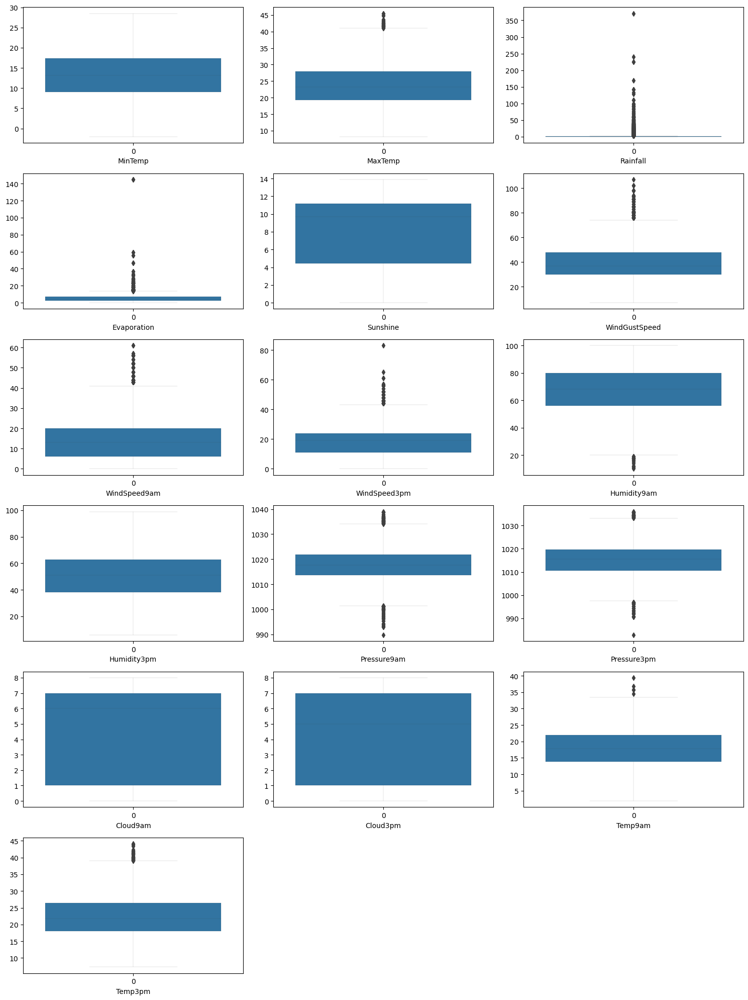

In [126]:
plt.figure(figsize=(15,20))
for index,column in enumerate(num_columns):
    if index<=len(num_columns):
        plt.subplot((len(num_columns)+2)//3,3,index+1)
        sns.boxplot(df_raintomorrow[column],linewidth=.1)
        plt.xlabel(column)
plt.tight_layout()
plt.show()

- Columns MaxTemp, Evaporation, WindGustSpeed, WindSpeed9am, WindSpeed9am, WindSpeed3pm, Humidity9am, Pressure9am, Pressure3pm, Temp9am, Temp3pm and Rainfall has outliers present.

Checking outlier using zscore

In [127]:
def outliers_check(df):
    z_score=np.abs(zscore(df_raintomorrow[num_columns]))
    print(np.where(z_score>3))
    return z_score

In [128]:
z_score=outliers_check(df_raintomorrow)

(array([  12,   12,   42,   42,   50,   50,   58,   58,   59,   59,   60,
         60,   60,   65,   65,   66,   66,  121,  265,  292,  377,  377,
        401,  401,  402,  402,  403,  403,  427,  448,  547,  552,  552,
        665,  665,  681,  695,  730,  752,  778,  779,  784,  915,  929,
        959,  960,  960,  960,  988,  989,  991, 1118, 1128, 1129, 1131,
       1169, 1183, 1217, 1221, 1244, 1245, 1337, 1391, 1392, 1393, 1459,
       1460, 1461, 1493, 1515, 1567, 1624, 1641, 1645, 1653, 1660, 1754,
       1791, 1845, 1870, 1875, 1917, 1988, 2000, 2015, 2044, 2078, 2086,
       2151, 2163, 2181, 2181, 2192, 2193, 2227, 2391, 2448, 2460, 2485,
       2485, 2499, 2551, 2634, 2635, 2691, 2780, 2788, 2795, 2795, 2801,
       2805, 2809, 2815, 2823, 2829, 2836, 2837, 2843, 2844, 2846, 2847,
       2851, 2855, 2857, 2865, 2871, 2879, 2885, 2893, 2899, 2907, 2913,
       2917, 2931, 2945, 2990, 2998, 2998, 2999, 3005, 3006, 3006, 3006,
       3007, 3009, 3021, 3021, 3021, 3028, 3028, 3

Creating a copy of dataframe

In [129]:
data=df_raintomorrow.copy()

Removing outliers in the dataset

In [130]:
def removing_outliers(z_score,data):
    data=data[(z_score<3).all(axis=1)]
    return data

In [131]:
data=outliers_removal(z_score,data)

Checking total data loss

In [132]:
total_data_loss=df_raintomorrow.shape[0]-data.shape[0]
total_data_loss

401

- A total of 401 rows of data is lost.

Checking total percentage of data loss

In [133]:
total_data_loss_percentage=total_data_loss*100/df_raintomorrow.shape[0]
total_data_loss_percentage

4.963485579898502

- The total data lost percentage is 4.96% which is within the acceptable range.

Checking outliers using IQR

In [134]:
Q1=df_raintomorrow[num_columns].quantile(0.25)
Q3=df_raintomorrow[num_columns].quantile(0.75)

IQR=Q3-Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

bounds = (df_raintomorrow[num_columns]>=lower_bound) & (df_raintomorrow[num_columns]<=upper_bound)

df_no_outliers=df[bounds.all(axis=1)]

Checking data loss after outliers removal

In [135]:
total_data_loss_by_IQR=df_raintomorrow.shape[0]-df_no_outliers.shape[0]
total_data_loss_by_IQR

2006

Checking data loss percentage after outliers removal using IQR

In [136]:
total_data_loss_percentage_by_IQR=(total_data_loss_by_IQR*100)/df_raintomorrow.shape[0]
total_data_loss_percentage_by_IQR

24.829805669018445

- The total data lost percentage is 24.82% which is very high then acceptable range. 
- Hence we will use zscore to remove outliers.

Removing outliers using zscore

In [137]:
df_raintomorrow=data.reset_index(drop=True)

Checking the shape of the dataframe after outliers removal

In [138]:
df_raintomorrow.shape

(7678, 23)

- Now the dataset has 7678 rows and 23 columns.

#### Checking skewness

In [139]:
df_raintomorrow[num_columns].skew()

MinTemp         -0.065771
MaxTemp          0.321074
Rainfall         3.491081
Evaporation      0.840491
Sunshine        -0.737622
WindGustSpeed    0.642255
WindSpeed9am     0.717114
WindSpeed3pm     0.318055
Humidity9am     -0.226786
Humidity3pm      0.137259
Pressure9am      0.094251
Pressure3pm      0.035633
Cloud9am        -0.495562
Cloud3pm        -0.248895
Temp9am         -0.039063
Temp3pm          0.339312
dtype: float64

- We can observe skewness in columns Rainfall, Evaporation, WindGustSpeed, WindSpeed9am.

Removing skewness from Rainfall

Checking skewness by applying sqrt

In [140]:
skewness_chk_sqrt=np.sqrt(df_raintomorrow[['Rainfall', 'Evaporation', 'WindGustSpeed','WindSpeed9am']])
skewness_chk_sqrt.skew()

Rainfall         1.985477
Evaporation      0.152654
WindGustSpeed    0.167987
WindSpeed9am    -0.499542
dtype: float64

- We can observe that after applying sqrt column WindGustSpeed and WindSpeed9am are within the acceptable range.

Checking skewness by applying cbrt

In [141]:
skewness_chk_cbrt=np.cbrt(df_raintomorrow[['Rainfall', 'Evaporation', 'WindGustSpeed','WindSpeed9am']])
skewness_chk_cbrt.skew()

Rainfall         1.437158
Evaporation     -0.203642
WindGustSpeed   -0.002373
WindSpeed9am    -1.231782
dtype: float64

Checking skewness by applying log tranformation

In [142]:
skewness_chk_log=np.log(df_raintomorrow['Rainfall']+.000001)
skewness_chk_log.skew()

0.7015060882138463

Removing skewness from WindGustSpeed and WindSpeed9am applying sqrt

In [143]:
df_raintomorrow['WindGustSpeed']=np.sqrt(df_raintomorrow['WindGustSpeed'])
df_raintomorrow['WindSpeed9am']=np.sqrt(df_raintomorrow['WindSpeed9am'])

Removing skewness from Evaporation applying cbrt

In [144]:
df_raintomorrow['Evaporation']=np.cbrt(df_raintomorrow['Evaporation'])

Removing skewness from Rainfall applying log

In [145]:
df_raintomorrow['Rainfall']=np.log(df_raintomorrow['Rainfall']+.000001)

Re-checking skewness

In [146]:
df_raintomorrow[num_columns].skew()

MinTemp         -0.065771
MaxTemp          0.321074
Rainfall         0.701506
Evaporation     -0.203642
Sunshine        -0.737622
WindGustSpeed    0.167987
WindSpeed9am    -0.499542
WindSpeed3pm     0.318055
Humidity9am     -0.226786
Humidity3pm      0.137259
Pressure9am      0.094251
Pressure3pm      0.035633
Cloud9am        -0.495562
Cloud3pm        -0.248895
Temp9am         -0.039063
Temp3pm          0.339312
dtype: float64

- The skewness is within acceptable range

#### Feature Selection

We can drop the column Date as it does not have any role in predicting RainTomorrow.

Dropping column Date

In [147]:
df_raintomorrow.drop('Date',axis=1,inplace=True)

#### Label Encoding of categorical columns

In [148]:
le=LabelEncoder()
df_raintomorrow[cat_columns]=df_raintomorrow[cat_columns].apply(lambda x:le.fit_transform(x))

In [149]:
df_raintomorrow

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,1,13.4,22.9,-5.108240e-01,1.948695,13.3,13,6.633250,13,14,4.472136,24.0,71.0,22.0,1007.7,1007.1,8.0,7.0,16.9,21.8,0,0
1,1,7.4,25.1,-1.381551e+01,1.948695,13.3,14,6.633250,6,15,2.000000,22.0,44.0,25.0,1010.6,1007.8,7.0,7.0,17.2,24.3,0,0
2,1,12.9,25.7,-1.381551e+01,1.948695,13.3,15,6.782330,13,15,4.358899,26.0,38.0,30.0,1007.6,1008.7,7.0,2.0,21.0,23.2,0,0
3,1,9.2,28.0,-1.381551e+01,1.948695,13.3,4,4.898979,9,0,3.316625,9.0,45.0,16.0,1017.6,1012.8,7.0,7.0,18.1,26.5,0,0
4,1,17.5,32.3,9.999995e-07,1.948695,13.3,13,6.403124,1,7,2.645751,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7673,9,3.5,21.8,-1.381551e+01,1.169607,0.0,0,5.567764,2,0,3.872983,13.0,59.0,27.0,1024.7,1021.2,7.0,8.0,9.4,20.9,0,0
7674,9,2.8,23.4,-1.381551e+01,1.169607,0.0,0,5.567764,9,1,3.605551,11.0,51.0,24.0,1024.6,1020.3,7.0,8.0,10.1,22.4,0,0
7675,9,3.6,25.3,-1.381551e+01,1.169607,0.0,6,4.690416,9,3,3.605551,9.0,56.0,21.0,1023.5,1019.1,7.0,8.0,10.9,24.5,0,0
7676,9,5.4,26.9,-1.381551e+01,1.169607,0.0,3,6.082763,9,14,3.000000,9.0,53.0,24.0,1021.0,1016.8,7.0,8.0,12.5,26.1,0,0


#### Scaling the dataset

- Separating the target and independent columns

In [150]:
x_raintomorrow=df_raintomorrow.drop('RainTomorrow',axis=1)
y_raintomorrow=df_raintomorrow['RainTomorrow']

In [151]:
def StandardScaling(x_raintomorrow):
    st=StandardScaler()
    x_raintomorrow=pd.DataFrame(st.fit_transform(x_raintomorrow),columns=x_raintomorrow.columns)
    return x_raintomorrow

In [152]:
StandardScaling(x_raintomorrow)

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
0,-1.496151,0.067018,-0.143453,1.179326,0.997024,1.155187,1.151031,0.503330,1.203810,1.403344,0.770539,0.658457,0.185359,-1.603942,-1.626256,-1.372691,1.134155,0.884225,-0.135191,-0.094299,-0.55157
1,-1.496151,-1.037239,0.223108,-0.720336,0.997024,1.155187,1.360722,0.503330,-0.349760,1.628802,-0.822899,0.443424,-1.442724,-1.438655,-1.160354,-1.258991,0.781574,0.884225,-0.081596,0.333400,-0.55157
2,-1.496151,-0.025003,0.323080,-0.720336,0.997024,1.155187,1.570412,0.645312,1.203810,1.628802,0.697551,0.873489,-1.804520,-1.163176,-1.642322,-1.112806,0.781574,-0.889863,0.597278,0.145212,-0.55157
3,-1.496151,-0.705962,0.706304,-0.720336,0.997024,1.155187,-0.736184,-1.148366,0.316056,-1.753071,0.025743,-0.954287,-1.382424,-1.934517,-0.035764,-0.446851,0.781574,0.884225,0.079190,0.709774,-0.55157
4,-1.496151,0.821594,1.422765,1.252262,0.997024,1.155187,1.151031,0.284161,-1.459453,-0.174864,-0.406674,0.228392,0.848652,-0.997888,-1.128223,-1.551362,0.781574,1.239043,0.025595,1.257228,-0.55157
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7673,1.033776,-1.755006,-0.326734,-0.720336,-1.340257,-1.757097,-1.574946,-0.511424,-1.237514,-1.753071,0.384349,-0.524222,-0.538233,-1.328463,1.104893,0.917545,0.781574,1.239043,-1.475074,-0.248270,-0.55157
7674,1.033776,-1.883836,-0.060144,-0.720336,-1.340257,-1.757097,-1.574946,-0.511424,0.316056,-1.527613,0.211974,-0.739255,-1.020628,-1.493751,1.088827,0.771360,0.781574,1.239043,-1.350019,0.008349,-0.55157
7675,1.033776,-1.736601,0.256432,-0.720336,-1.340257,-1.757097,-0.316803,-1.346999,0.316056,-1.076697,0.211974,-0.954287,-0.719131,-1.659038,0.912106,0.576446,0.781574,1.239043,-1.207098,0.367616,-0.55157
7676,1.033776,-1.405324,0.523023,-0.720336,-1.340257,-1.757097,-0.945874,-0.020947,0.316056,1.403344,-0.178340,-0.954287,-0.900030,-1.493751,0.510466,0.202862,0.781574,1.239043,-0.921256,0.641343,-0.55157


#### Checking the Variance Inflation Factor

In [153]:
def vif_cal(x_raintomorrow):
    vif=pd.DataFrame()
    vif['Columns']=x_raintomorrow.columns
    vif['VIF Factor']=[VIF(x_raintomorrow.values,i) for i in range(x_raintomorrow.shape[1])]
    return vif

In [154]:
vif_cal(x_raintomorrow)

,Columns,VIF Factor
0,Location,4.846711
1,MinTemp,56.471214
2,MaxTemp,481.207642
3,Rainfall,8.845113
4,Evaporation,53.795809
5,Sunshine,6.892937
6,WindGustDir,5.243745
7,WindGustSpeed,77.624489
8,WindDir9am,4.940142
9,WindDir3pm,5.792285


- Columns Pressure9am, Pressure3pm has very high variance inflation. 
- We can observe high variance in columns Temp3pm, MaxTemp, Temp9am, WindGustSpeed, MinTemp, Humidity9am, Humidity3pm.
- Hence we will drop Pressure9am.

Dropping Pressure9am column

In [155]:
x_raintomorrow.drop('Pressure9am',axis=1,inplace=True)

Checking VIF

In [156]:
vif_cal(x_raintomorrow)

,Columns,VIF Factor
0,Location,4.834249
1,MinTemp,55.976858
2,MaxTemp,481.138398
3,Rainfall,8.835613
4,Evaporation,53.752223
5,Sunshine,6.503988
6,WindGustDir,5.237921
7,WindGustSpeed,77.618287
8,WindDir9am,4.906411
9,WindDir3pm,5.693382


- We can observe high variance in columns Temp3pm, MinTemp, MaxTemp, Temp9am, WindGustSpeed, Pressure3pm, MinTemp, Humidity9am, Humidity3pm, Evaporation.
- Hence we will drop Temp3pm.

Dropping column Temp3pm

In [157]:
x_raintomorrow.drop('Temp3pm',axis=1,inplace=True)

Checking VIF

In [158]:
vif_cal(x_raintomorrow)

,Columns,VIF Factor
0,Location,4.827234
1,MinTemp,55.653721
2,MaxTemp,154.240468
3,Rainfall,8.833609
4,Evaporation,53.746394
5,Sunshine,6.494446
6,WindGustDir,5.235348
7,WindGustSpeed,76.941850
8,WindDir9am,4.881986
9,WindDir3pm,5.664950


- We can observe high variance in columns Pressure3pm, Temp9am, MaxTemp, WindGustSpeed, MinTemp, Humidity9am, Humidity3pm, Evaporation.
- Hence we will drop Temp9am.

Dropping Temp9am column

In [159]:
x_raintomorrow.drop('Temp9am',axis=1,inplace=True)

Checking VIF

In [160]:
vif_cal(x_raintomorrow)

,Columns,VIF Factor
0,Location,4.786486
1,MinTemp,30.214635
2,MaxTemp,88.320548
3,Rainfall,8.833318
4,Evaporation,53.738471
5,Sunshine,6.418794
6,WindGustDir,5.227978
7,WindGustSpeed,75.677986
8,WindDir9am,4.881316
9,WindDir3pm,5.664826


- We can observe high variance in columns Pressure3pm, MaxTemp, WindGustSpeed, Humidity9am, MinTemp.
- Hence we will drop Pressure3pm.

Dropping Pressure3pm column

In [161]:
x_raintomorrow.drop('Pressure3pm',axis=1,inplace=True)

Checking VIF

In [162]:
vif_cal(x_raintomorrow)

,Columns,VIF Factor
0,Location,4.780653
1,MinTemp,23.800430
2,MaxTemp,66.412965
3,Rainfall,8.195526
4,Evaporation,50.018865
5,Sunshine,6.418767
6,WindGustDir,5.222560
7,WindGustSpeed,61.723941
8,WindDir9am,4.547976
9,WindDir3pm,5.607868


- We can observe high variance in columns MaxTemp, WindGustSpeed, Humidity9am, Humidity3pm, MinTemp.
- Hence we will drop MaxTemp.

Dropping MaxTemp column

In [163]:
x_raintomorrow.drop('MaxTemp',axis=1,inplace=True)

Checking VIF

In [164]:
vif_cal(x_raintomorrow)

,Columns,VIF Factor
0,Location,4.778326
1,MinTemp,12.556288
2,Rainfall,7.655961
3,Evaporation,43.031280
4,Sunshine,6.284617
5,WindGustDir,5.222246
6,WindGustSpeed,56.910807
7,WindDir9am,4.538628
8,WindDir3pm,5.606284
9,WindSpeed9am,9.779118


- We can observe high variance in columns WindGustSpeed, Evaporation, Humidity9am, Humidity3pm.
- Hence we will drop WindGustSpeed.

Dropping WindGustSpeed column

In [165]:
x_raintomorrow.drop('WindGustSpeed',axis=1,inplace=True)

Checking VIF

In [166]:
vif_cal(x_raintomorrow)

,Columns,VIF Factor
0,Location,4.735516
1,MinTemp,12.521510
2,Rainfall,7.416533
3,Evaporation,37.121824
4,Sunshine,6.283069
5,WindGustDir,5.193024
6,WindDir9am,4.524636
7,WindDir3pm,5.540711
8,WindSpeed9am,8.536621
9,WindSpeed3pm,7.056854


- We can observe high variance in columns Evaporation, Humidity9am, Humidity3pm.
- Hence we will drop Evaporation.

Dropping Evaporation column

In [167]:
x_raintomorrow.drop('Evaporation',axis=1,inplace=True)

Checking VIF

In [168]:
vif_cal(x_raintomorrow)

,Columns,VIF Factor
0,Location,4.726987
1,MinTemp,8.896469
2,Rainfall,6.463894
3,Sunshine,5.241441
4,WindGustDir,5.190367
5,WindDir9am,4.510047
6,WindDir3pm,5.411519
7,WindSpeed9am,8.237949
8,WindSpeed3pm,7.010302
9,Humidity9am,23.339539


- We can observe high variance in columns Humidity9am, Humidity3pm.
- Hence we will drop Humidity9am.

Dropping Humidity9am column

In [169]:
x_raintomorrow.drop('Humidity9am',axis=1,inplace=True)

Checking VIF

In [170]:
vif_cal(x_raintomorrow)

,Columns,VIF Factor
0,Location,4.609013
1,MinTemp,8.885735
2,Rainfall,5.889502
3,Sunshine,5.039422
4,WindGustDir,5.180874
5,WindDir9am,4.502244
6,WindDir3pm,5.332720
7,WindSpeed9am,8.026560
8,WindSpeed3pm,7.010294
9,Humidity3pm,10.642702


- Now the variance inflation is within the acceptable range.

#### Checking Imbalance dataset 

Checking value counts of RainTomorrow

In [171]:
y_raintomorrow.value_counts()

RainTomorrow
0    5916
1    1762
Name: count, dtype: int64

- We can observe that the dataset is imbalanced. Hence we need to apply SMOTE to make the dataset balanced.

Applying SMOTE to make the dataset balance

In [172]:
sm=SMOTE()
x_raintomorrow,y_raintomorrow=sm.fit_resample(x_raintomorrow,y_raintomorrow)

Verifying the value counts

In [173]:
y_raintomorrow.value_counts()

RainTomorrow
0    5916
1    5916
Name: count, dtype: int64

- Now the dataset is balanced and ready for modelling

#### Modelling

Evaluating the best random_state using Logistic regression

In [174]:
def best_random_state(x_raintomorrow,y_raintomorrow):
    best_randomstate=0
    best_score=0
    
    lr=LogisticRegression()
    for rs in range (1,201):
        x_train,x_test,y_train,y_test=train_test_split(x_raintomorrow,y_raintomorrow,random_state=rs)
        lr.fit(x_train,y_train)
        prediction=lr.predict(x_test)
        score=accuracy_score(y_test,prediction)
        
        if score>best_score:
            best_score=score
            best_randomstate=rs
    print('Accuracy score: {} and Random state: {}'.format(best_score, best_randomstate))

In [175]:
best_random_state(x_raintomorrow,y_raintomorrow)

Accuracy score: 0.768762677484787 and Random state: 155


Spliting dataset into train and test

In [200]:
x_train,x_test,y_train,y_test=train_test_split(x_raintomorrow,y_raintomorrow,test_size=.30,random_state=155)

Logistic regression model

In [201]:
def logistic_regression(x_train,x_test,y_train,y_test):
    lr=LogisticRegression()
    lr.fit(x_train,y_train)
    lr_pred=lr.predict(x_test)
    
    acc_lr=accuracy_score(y_test,lr_pred)
    print('The accuracy using Logistic regression is: {:4f}% '.format((acc_lr)*100))
    print(confusion_matrix(y_test,lr_pred))
    print(classification_report(y_test,lr_pred))
    
    return lr_pred, acc_lr

In [202]:
lr_pred, acc_lr=logistic_regression(x_train,x_test,y_train,y_test)

The accuracy using Logistic regression is: 76.816901% 
[[1376  403]
 [ 420 1351]]
              precision    recall  f1-score   support

           0       0.77      0.77      0.77      1779
           1       0.77      0.76      0.77      1771

    accuracy                           0.77      3550
   macro avg       0.77      0.77      0.77      3550
weighted avg       0.77      0.77      0.77      3550



Support Vector Classification

In [203]:
def support_vector(x_train,x_test,y_train,y_test):
    svc=SVC()
    svc.fit(x_train,y_train)
    svc_pred=svc.predict(x_test)
    acc_svc=accuracy_score(y_test,svc_pred)
    
    print('The accuracy using SVC is: {:4f}% '.format((acc_svc)*100))
    print(confusion_matrix(y_test,svc_pred))
    print(classification_report(y_test,svc_pred))
    
    return svc_pred, acc_svc

In [204]:
svc_pred, acc_svc=support_vector(x_train,x_test,y_train,y_test)

The accuracy using SVC is: 78.000000% 
[[1450  329]
 [ 452 1319]]
              precision    recall  f1-score   support

           0       0.76      0.82      0.79      1779
           1       0.80      0.74      0.77      1771

    accuracy                           0.78      3550
   macro avg       0.78      0.78      0.78      3550
weighted avg       0.78      0.78      0.78      3550



Random Forest Classifier

In [205]:
def random_forest(x_train,x_test,y_train,y_test):
    
    rfc=RandomForestClassifier()
    rfc.fit(x_train,y_train)
    rfc_pred=rfc.predict(x_test)
    
    acc_rfc=accuracy_score(y_test,rfc_pred)
    print('The accuracy using Random Forest is: {:4f}% '.format((accuracy_score(y_test,rfc_pred))*100))
    print(confusion_matrix(y_test,rfc_pred))
    print(classification_report(y_test,rfc_pred))
    
    return rfc_pred,acc_rfc

In [206]:
rfc_pred,acc_rfc = random_forest(x_train,x_test,y_train,y_test)

The accuracy using Random Forest is: 92.197183% 
[[1656  123]
 [ 154 1617]]
              precision    recall  f1-score   support

           0       0.91      0.93      0.92      1779
           1       0.93      0.91      0.92      1771

    accuracy                           0.92      3550
   macro avg       0.92      0.92      0.92      3550
weighted avg       0.92      0.92      0.92      3550



Adaboost Classifier

In [207]:
def adaboost(x_train,x_test,y_train,y_test):
    
    abc=AdaBoostClassifier()
    abc.fit(x_train,y_train)
    abc_pred=abc.predict(x_test)
    
    acc_abc=accuracy_score(y_test,abc_pred)
    print('The accuracy using Adaboost is: {:4f}% '.format((accuracy_score(y_test,abc_pred))*100))
    print(confusion_matrix(y_test,abc_pred))
    print(classification_report(y_test,abc_pred))
    
    return abc_pred, acc_abc

In [208]:
abc_pred, acc_abc = adaboost(x_train,x_test,y_train,y_test)

The accuracy using Adaboost is: 81.549296% 
[[1478  301]
 [ 354 1417]]
              precision    recall  f1-score   support

           0       0.81      0.83      0.82      1779
           1       0.82      0.80      0.81      1771

    accuracy                           0.82      3550
   macro avg       0.82      0.82      0.82      3550
weighted avg       0.82      0.82      0.82      3550



Gradient Boost Classifier

In [209]:
def gradientboost(x_train,x_test,y_train,y_test):
    
    gbc=GradientBoostingClassifier()
    gbc.fit(x_train,y_train)
    gbc_pred=gbc.predict(x_test)
    
    acc_gbc=accuracy_score(y_test,gbc_pred)
    print('The accuracy using Gradientboost is: {:4f}% '.format((accuracy_score(y_test,gbc_pred))*100))
    print(confusion_matrix(y_test,gbc_pred))
    print(classification_report(y_test,gbc_pred))
    
    return gbc_pred,acc_gbc

In [210]:
gbc_pred, acc_gbc = gradientboost(x_train,x_test,y_train,y_test)

The accuracy using Gradientboost is: 86.281690% 
[[1572  207]
 [ 280 1491]]
              precision    recall  f1-score   support

           0       0.85      0.88      0.87      1779
           1       0.88      0.84      0.86      1771

    accuracy                           0.86      3550
   macro avg       0.86      0.86      0.86      3550
weighted avg       0.86      0.86      0.86      3550



Bagging classifier

In [211]:
def baggingclassifier(x_train,x_test,y_train,y_test):
    
    bc=BaggingClassifier()
    bc.fit(x_train,y_train)
    bc_pred=bc.predict(x_test)
    
    acc_bc=accuracy_score(y_test,bc_pred)
    print('The accuracy using Bagging classfier is: {:4f}% '.format((accuracy_score(y_test,bc_pred))*100))
    print(confusion_matrix(y_test,bc_pred))
    print(classification_report(y_test,bc_pred))
    
    return bc_pred,acc_bc

In [212]:
bc_pred, acc_bc = baggingclassifier(x_train,x_test,y_train,y_test)

The accuracy using Bagging classfier is: 90.309859% 
[[1655  124]
 [ 220 1551]]
              precision    recall  f1-score   support

           0       0.88      0.93      0.91      1779
           1       0.93      0.88      0.90      1771

    accuracy                           0.90      3550
   macro avg       0.90      0.90      0.90      3550
weighted avg       0.90      0.90      0.90      3550



ExtraTree classifier

In [213]:
def extratree_classifier(x_train,x_test,y_train,y_test):
    
    etc=ExtraTreesClassifier()
    etc.fit(x_train,y_train)
    etc_pred=etc.predict(x_test)
    
    acc_etc=accuracy_score(y_test,etc_pred)
    print('The accuracy using Extratrees is: {:4f}% '.format((accuracy_score(y_test,etc_pred))*100))
    print(confusion_matrix(y_test,etc_pred))
    print(classification_report(y_test,etc_pred))
    
    return etc_pred, acc_etc

In [214]:
etc_pred, acc_etc=extratree_classifier(x_train,x_test,y_train,y_test)

The accuracy using Extratrees is: 93.239437% 
[[1660  119]
 [ 121 1650]]
              precision    recall  f1-score   support

           0       0.93      0.93      0.93      1779
           1       0.93      0.93      0.93      1771

    accuracy                           0.93      3550
   macro avg       0.93      0.93      0.93      3550
weighted avg       0.93      0.93      0.93      3550



DecisionTree classifier

In [215]:
def decisiontree_classifier(x_train,x_test,y_train,y_test):
    
    dtc=DecisionTreeClassifier()
    dtc.fit(x_train,y_train)
    dtc_pred=dtc.predict(x_test)
    
    acc_dtc=accuracy_score(y_test,dtc_pred)
    print('The accuracy using Decisiontree is: {:4f}% '.format((accuracy_score(y_test,dtc_pred))*100))
    print(confusion_matrix(y_test,dtc_pred))
    print(classification_report(y_test,dtc_pred))
    
    return dtc_pred, acc_dtc

In [216]:
dtc_pred, acc_dtc = decisiontree_classifier(x_train,x_test,y_train,y_test)

The accuracy using Decisiontree is: 85.802817% 
[[1530  249]
 [ 255 1516]]
              precision    recall  f1-score   support

           0       0.86      0.86      0.86      1779
           1       0.86      0.86      0.86      1771

    accuracy                           0.86      3550
   macro avg       0.86      0.86      0.86      3550
weighted avg       0.86      0.86      0.86      3550



KNN classifier

In [217]:
def knn(x_train,x_test,y_train,y_test):
    
    knn=KNeighborsClassifier()
    knn.fit(x_train,y_train)
    knn_pred=knn.predict(x_test)
    
    acc_knn=accuracy_score(y_test,knn_pred)
    print('The accuracy using KNN is: {:4f}% '.format((accuracy_score(y_test,knn_pred))*100))
    print(confusion_matrix(y_test,knn_pred))
    print(classification_report(y_test,knn_pred))
    
    return knn_pred, acc_knn

In [218]:
knn_pred, acc_knn = knn(x_train,x_test,y_train,y_test)

The accuracy using KNN is: 86.084507% 
[[1364  415]
 [  79 1692]]
              precision    recall  f1-score   support

           0       0.95      0.77      0.85      1779
           1       0.80      0.96      0.87      1771

    accuracy                           0.86      3550
   macro avg       0.87      0.86      0.86      3550
weighted avg       0.87      0.86      0.86      3550



Ridge Classifier

In [219]:
def ridge(x_train,x_test,y_train,y_test):
    
    rd=RidgeClassifier()
    rd.fit(x_train,y_train)
    rd_pred=rd.predict(x_test)
    
    acc_rd=accuracy_score(y_test,rd_pred)
    print('The accuracy using Ridge is: {:4f}% '.format((accuracy_score(y_test,rd_pred))*100))
    print(confusion_matrix(y_test,rd_pred))
    print(classification_report(y_test,rd_pred))
    
    return rd_pred, acc_rd

In [220]:
rd_pred, acc_rd = ridge(x_train,x_test,y_train,y_test)

The accuracy using Ridge is: 76.788732% 
[[1379  400]
 [ 424 1347]]
              precision    recall  f1-score   support

           0       0.76      0.78      0.77      1779
           1       0.77      0.76      0.77      1771

    accuracy                           0.77      3550
   macro avg       0.77      0.77      0.77      3550
weighted avg       0.77      0.77      0.77      3550



#### Cross Validating the models

In [221]:
def cross_validation(x,y,*args):
    
    # Cross validation for Logistic Regression
    lr=LogisticRegression()
    lr_score=cross_val_score(lr,x,y)
    diff_lr=accuracy_score(y_test,lr_pred)-lr_score.mean()
    
    # Cross SVC
    svc=SVC()
    svc_score=cross_val_score(svc,x,y)
    diff_svc=accuracy_score(y_test,svc_pred)-svc_score.mean()
    
    # Cross validation for RandomForestClassifier
    rfc=RandomForestClassifier()
    rfc_score=cross_val_score(rfc,x,y)
    diff_rfc=accuracy_score(y_test,rfc_pred)-rfc_score.mean()
    
    # Cross validation for AdaBoostClassifier
    abc=AdaBoostClassifier()
    abc_score=cross_val_score(abc,x,y)
    diff_abc=accuracy_score(y_test,abc_pred)-abc_score.mean()
    
    # Cross validation for GradientBoostingClassifier
    gbc=GradientBoostingClassifier()
    gbc_score=cross_val_score(gbc,x,y)
    diff_gbc=accuracy_score(y_test,gbc_pred)-gbc_score.mean()
    
    # Cross validation for BaggingClassifier
    bc=BaggingClassifier()
    bc_score=cross_val_score(bc,x,y)
    diff_bc=accuracy_score(y_test,bc_pred)-bc_score.mean()
    
    # Cross validation for ExtraTreesClassifier
    etc=ExtraTreesClassifier()
    etc_score=cross_val_score(etc,x,y)
    diff_etc=accuracy_score(y_test,etc_pred)-etc_score.mean()
    
    # Cross validation for DecisionTreeClassifier
    dtc=DecisionTreeClassifier()
    dtc_score=cross_val_score(dtc,x,y)
    diff_dtc=accuracy_score(y_test,dtc_pred)-dtc_score.mean()
    
    # Cross validation for KNeighborsClassifier
    knn=KNeighborsClassifier()
    knn_score=cross_val_score(knn,x,y)
    diff_knn=accuracy_score(y_test,knn_pred)-knn_score.mean()
    
    # Cross validation for RidgeClassifier
    rd=RidgeClassifier()
    rd_score=cross_val_score(rd,x,y)
    diff_rd=accuracy_score(y_test,rd_pred)-rd_score.mean()
    
    df=pd.DataFrame({'Classification Name':['Logistic Regression',
                                        'SVC',
                                        'RandomForestClassifier',
                                        'AdaBoostClassifier',
                                        'GradientBoostingClassifier',
                                        'BaggingClassifier',
                                        'ExtraTreesClassifier',
                                        'DecisionTreeClassifier',
                                        'KNeighborsClassifier',
                                        'RidgeClassfier'],
                     'Classification Score':[acc_lr, acc_svc, acc_rfc, acc_abc, acc_gbc, acc_bc, acc_etc, acc_dtc, acc_knn,acc_rd],
                     'Cross Val Score':[lr_score.mean(), 
                                        svc_score.mean(), 
                                        rfc_score.mean(), 
                                        abc_score.mean(), 
                                        gbc_score.mean(), 
                                        bc_score.mean(), 
                                        etc_score.mean(), 
                                        dtc_score.mean(), 
                                        knn_score.mean(),
                                        rd_score.mean()],
                     'Difference': [diff_lr, diff_svc, diff_rfc, diff_abc, diff_gbc, diff_bc, diff_etc, diff_dtc, diff_knn, diff_rd]
                    })
    return df

In [222]:
model_pred=[lr_pred, svc_pred, rfc_pred, abc_pred, gbc_pred, bc_pred, etc_pred, dtc_pred, knn_pred,rd_pred]

In [223]:
cross_validation(x_raintomorrow,y_raintomorrow,model_pred)

,Classification Name,Classification Score,Cross Val Score,Difference
0,Logistic Regression,0.768169,0.699208,0.068961
1,SVC,0.780000,0.721519,0.058481
2,RandomForestClassifier,0.921972,0.809088,0.112884
3,AdaBoostClassifier,0.815493,0.662279,0.153214
4,GradientBoostingClassifier,0.862817,0.686286,0.176531
5,BaggingClassifier,0.903099,0.795480,0.107618
6,ExtraTreesClassifier,0.932394,0.822860,0.109534
7,DecisionTreeClassifier,0.858028,0.757872,0.100156
8,KNeighborsClassifier,0.860845,0.792009,0.068837
9,RidgeClassfier,0.767887,0.704279,0.063608


- ExtraTreesClassifier has the highest cross-validation scores (0.830214), indicating strong performance on unseen data.
- It also has a high training score (0.931549), suggesting it is capable of learning complex patterns in the data.
- The ExtraTreesClassifier is the best model due to its high cross-validation score and overall performance.

### Hyper parameter tuning

In [224]:
parameters = {
    'n_estimators': [50, 100, 200],               
    'max_features': ['auto', 'sqrt'],    
    'max_depth': [None, 10, 20, 30],                                                
    'random_state': [23, 42,45,75],
    'n_jobs':[-2, -1, 1],
    'criterion':['gini','entropy']
}

In [225]:
gridsearch_cv=GridSearchCV(ExtraTreesClassifier(),parameters,cv=5)
gridsearch_cv.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=ExtraTreesClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [None, 10, 20, 30],
                         'max_features': ['auto', 'sqrt'],
                         'n_estimators': [50, 100, 200], 'n_jobs': [-2, -1, 1],
                         'random_state': [23, 42, 45, 75]})

In [226]:
gridsearch_cv.best_params_

{'criterion': 'entropy',
 'max_depth': None,
 'max_features': 'auto',
 'n_estimators': 200,
 'n_jobs': -2,
 'random_state': 42}

#### Creating the final model

In [227]:
def final_model(x_train,x_test,y_train,y_test):
    final_model_extratrees=ExtraTreesClassifier(criterion='entropy',max_depth=None,max_features='auto',n_estimators=200,n_jobs=-2,random_state=42)
    final_model_extratrees.fit(x_train,y_train)
    prediction=final_model_extratrees.predict(x_test)
    accuracy=accuracy_score(y_test,prediction)
    
    print('The final accuracy is: {:.2f}%'.format((accuracy)*100))
    
    return final_model_extratrees, prediction, accuracy

In [228]:
final_model, prediction, accuracy=final_model(x_train,x_test,y_train,y_test)

The final accuracy is: 93.24%


#### Plotting ROC curve and comparing AUC

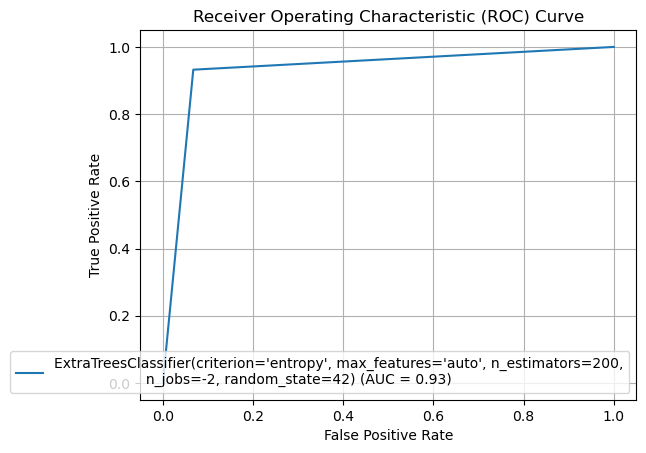

In [231]:
fpr,tpr, thresholds=metrics.roc_curve(y_test,prediction)
roc_auc=metrics.auc(fpr,tpr)
disp=metrics.RocCurveDisplay(fpr=fpr,tpr=tpr,roc_auc=roc_auc,estimator_name=final_model)
disp.plot()
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.grid(True)
plt.show()

### Saving the Model

In [233]:
file='Rainfall_Weather_Forecasting_RainTomorrow.pkl'
pickle.dump(final_model,open(file,'wb'))